In [54]:
#updated patient Data completeness to look at devisions across amyloid positive and negative groups

definitions

In [1]:
#this contains the information for a patient class
#creates a class for patients so we can call information about them easily
class patient:
    def __init__(self, filepath, input_fileName, lengthPtID):
        ptID = input_fileName[:lengthPtID]
        self.ptID = ptID
        self.fileName = input_fileName
        #find the demographics in one of two sheets
        # directory = os.getcwd()
        file_adds = filepath + '/' + input_fileName
        file = pd.ExcelFile(file_adds)
        sheet_Names = file.sheet_names
        if 'Cancer_Registery Data' in sheet_Names:
            #do the thing for getting patient info
            df = pd.read_excel(input_fileName, sheet_name= 'Cancer_Registery Data')
            self.ptDemographics = df
            self.amyloid_status = df.at[0,"Amyloid Status"]
            self.survival = df.at[0,"Survival Time (Months)"]
            self.ageDx = df.at[0,"Age At Diagnosis"] 
            self.sex = df.at[0,"Gender Cancer Registry"]
            self.vitalStatus = df.at[0, "Vital Status Cancer Registry"]
            self.dx = df.at[0, "Histology"]

        elif '30 Cerner Patients ' in sheet_Names:
            #do the thing for getting patient info
            df = pd.read_excel(input_fileName, sheet_name= '30 Cerner Patients ')
            self.ptDemographics = df
            self.amyloid_status = df.at[0,"Amyloid Status"]
            self.survival = df.at[0,"Survival Time (months)"]
            self.ageDx = df.at[0,"Age At Diagnosis"] 
            self.sex = df.at[0,"Gender Cerner"]
            self.vitalStatus = df.at[0, "Vital Status (Cerner)"]
            self.dx = df.at[0, "Primary Site"]


        else: print("no patient identifying information")

        #now iterate through the list of sheets to import the patient data 
        if 'Labs' in sheet_Names:
            self.labsData = pd.read_excel(input_fileName, sheet_name= 'Labs')
        else: self.labsData = False
        
        if 'amyloid in subject' in sheet_Names:
            self.echoData = pd.read_excel(input_fileName, sheet_name= 'amyloid in subject')
        else: self.echoData = False

        if 'ChemoTx' in sheet_Names:
            self.ChemoTx = pd.read_excel(input_fileName, sheet_name= 'ChemoTx')
        else: self.ChemoTx = False

        if 'Hematologic Tx' in sheet_Names:
            self.HemeTx = pd.read_excel(input_fileName, sheet_name= 'Hematologic Tx')
        else: self.HemeTx = False

        if 'Immuno Tx' in sheet_Names:
            self.HemeTx = pd.read_excel(input_fileName, sheet_name= 'Immuno Tx')
        else: self.ImmunoTx = False

        if 'Radiation Tx' in sheet_Names:
            self.RadTx = pd.read_excel(input_fileName, sheet_name= 'Radiation Tx')
        else: self.ImmunoTx = False

        if 'Physican_Notes' in sheet_Names:
            self.MDnotes = pd.read_excel(input_fileName, sheet_name= 'Physican_Notes')
        else: self.MDnotes = False

        #to create a callable list of treatments recieved for which we have data
        tx_sheets = ['ChemoTx', 'Hematologic Tx', 'Immuno Tx']
        treatmentTypesRecieved = []

        for possible in tx_sheets:
        
            if possible in sheet_Names:
                treatmentTypesRecieved.append(possible)
        self.txRecieved = treatmentTypesRecieved

In [2]:
def FilterList(list, keyWords_primary, keyWords_secondary = ["Empty"], omit = ["Empty"]):
    #store the filtered result
    filteredList = []

    if keyWords_secondary == ["Empty"]:
        for c in list: #loop the columns
            for buzz in keyWords_primary: #loop the key words
                if buzz in c: #if the column contains the key word
                    filteredList.append(c) #add the column to the list
                    break #do not continue testing primary key words for this column
    
    else: 
        for c in list: #loop the columns
            for buzz in keyWords_primary: #loop the key words
                if buzz in c: #if the column contains the key word
                    for secondary in keyWords_secondary:
                        if secondary in c:
                            filteredList.append(c) #add the column to the list
                            break #has been added to list based on passing the seondary 
                        else:
                            pass
                    break #do not continue to check primary key words for this column
                else:
                    pass
                
    if omit != ["Empty"]: 
        for x in omit: 
            for a in filteredList:
                if x in a:
                    filteredList.remove(a)
    
    #by iterating through the column names first, we keep the order of the columns

    return filteredList 


In [3]:
#createBinary function
def createBinary(df, listOfLabs, timeColumn): 
    #list of labs needs to match exactly.  
    # Filter the dataframe before inputting
    #for boolean
    df_toBool = df[listOfLabs]
    df_bool = df_toBool.notna()
    df_asint = df_bool.astype(int)
    #add column back for time 
    df_asint.insert(0, timeColumn, df[timeColumn])
    return df_asint

def createBinarySum(df, listOfLabs, timeColumn, defaxis):
    #list of labs needs to match exactly.  
    # Filter the dataframe before inputting
    #for boolean
    df_toBool = df[listOfLabs]
    df_bool = df_toBool.notna()
    df_asint = df_bool.astype(int)
    #add column back for time 
    # df_asint.insert(0, timeColumn, df[timeColumn])
    #sum across the row
    #defaxis = 0 means the columns are preserved 
    #defaxis =1 means the rows are preserved
    df_new_sum = df_asint.sum(axis = defaxis)
    return df_new_sum

In [4]:
#get list of patients from directory 
def GetListOfPatientsFromDirectory (directory, fileExtension, fileCommon, lengthID):
    #get the directory 
    listFileNames = os.listdir(directory)
    outputList = []
    #loop through list of fileNames: 
    for file in listFileNames:
        #id if the file is patient data
        if fileCommon in file and file.endswith(fileExtension):
            #trim the file name to the pt ID
            ptID = file[:lengthID]
            outputList.append(ptID)
    return outputList

In [5]:
def GetListofPTfiles(directory, fileExtension, fileCommon):
    listFileNames = os.listdir(directory)
    outListFiles = []
    #loop through file names
    for file in listFileNames:
        if fileCommon in file and file.endswith(fileExtension):
            outListFiles.append(file)
    return outListFiles

In [6]:
def getNormalValue(filteredDataColumn, skipValue = 6666):
    test = filteredDataColumn
    #input is a series
    
    for entry in test:
        if entry != skipValue:
            outputValue = entry
                # print("this is output: ", outputValue)
                #set x to True
            break
        else:
            # print("entry is blank")
            pass
    return outputValue

In [7]:
#get amyloid status dictionary inputs, sort ptIDs to lists based on amyloid status 
def getListSortedByAmyloid(amyloidDictionary, listPositive, listNegative, listOther,
                           statusPositive = "yes", statusNegative = "no"):
    for pt in amyloidDictionary.keys():
        status = amyloidDictionary[pt]
        if status == statusPositive:
            listPositive.append(pt)
        elif status == statusNegative:
            listNegative.append(pt)
        else:
            listOther.append(pt)
    #does not check for double listed patient IDs

In [8]:
#function for masking a dataframe 
def patientSectionOfFrame(start_frame, column_toMask, ptID):
    #ptID is a row parameter in the column_toMask
    df_use = start_frame #copy of the frame

    #first check if sheet has the column of interest
    data_top = list(start_frame.columns) #returns the headers as a list

    #determine of the sheet contains the column of interest
    if data_top.count(column_toMask) > 0: 
        #if true, now find if the patient is present
        searchForPt = start_frame[column_toMask].str.startswith(ptID).sum() #returns the number of instances of the patient
        if searchForPt > 0:
            #patient is present 
            #mask the data for the patient
            df_clean = df_use.dropna(subset= [column_toMask]) #removing NA 
            mask = df_clean[column_toMask].str.startswith(ptID) #masking for the rows where the patient has data
            df_sub_tosave = df_clean[mask] #output dataframe filtered for the patient
            return df_sub_tosave
        else:
            #the patient isn't present
            # return print("The patient " + ptID + " is not in " + sheet_name)
            pass
    else:
        #the column of interest isn't present
        # return print("The column " + column_toMask + " is not in the sheet " + sheet_name)
        pass



functions for saving data


In [9]:
def outputToExcel(df_data, fileName_header, fileName_Common, fileName_suffix,
                  parent_dir, folderName, sheetName):
    fileName = fileName_header + fileName_Common + fileName_suffix
    outfile_extension = '.xlsx'
    outfile_boxplts = fileName + outfile_extension
    path_out= os.path.join(parent_dir, folderName, outfile_boxplts)

    if os.path.exists(path_out):
            #if old sheet
            with pd.ExcelWriter(path_out, mode = 'a', if_sheet_exists = 'overlay') as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True)
    else: 
            #new sheet
            with pd.ExcelWriter(path_out) as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True) #if new sheet
    
def outputFiguresPath(fileName_header, fileName_mid, fileName_suff, parent_dir, folderName):
        fileName_header = str(fileName_header)
        fileName_mid = str(fileName_mid)
        fileName_suff = str(fileName_suff)

        #cleaning the input to prevent addition of / to the directory
        fileName_header = fileName_header.replace("/", "-")
        fileName_mid = fileName_mid.replace("/", "-")
        fileName_suff = fileName_suff.replace("/", "-")

        fileName = fileName_header + fileName_mid +fileName_suff
        out_filename = fileName + '.tif'
        new_filepath = os.path.join(parent_dir, folderName, out_filename)
        #the output path can be used to save the figure
        return new_filepath
        # plt.savefig(new_filepath, bbox_inches = 'tight')

def makeFolderPathForData(parent_dir, folderName_header, folderName_common, folderName_suffix):
    #makes a new directory for your files
    #returns the folder name for use in other functions
    folderName = folderName_header + folderName_common + folderName_suffix
    path = os.path.join(parent_dir,folderName)
    if not os.path.exists(path):
        os.mkdir(path)
    return folderName

libraries

In [10]:
#libraries and dirrectory 
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.patches as mpatches
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from scipy.optimize import curve_fit
import math as math

starting_directory = os.getcwd()

new_dirrectory = 'C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05'
os.chdir(new_dirrectory)


directories and importing data

In [11]:
#dirrectory and file information for where you want to save outputs
#making new path for saving output

dateTag = "_2024-06-24"
#make dirrectory for saving files 
parent_dir = new_dirrectory
folderName = "PtLabPlots" + dateTag
path = os.path.join(parent_dir,folderName)
if not os.path.exists(path):
    os.mkdir(path)

#create way to check to see if directory is already there

In [12]:
#importing patient data as dictionaries of dataframes
ptID_test = "E-01"

#build a dictionary of patients and their values 
ptFiles = GetListofPTfiles(new_dirrectory, '.xlsx', 'data')

patientDictAmyloid = {}
patientDictSurvival = {}
patientDictLabs = {}
patientDictEcho = {}
patientDictNotes = {}
patientDictDx = {}
patientDictVitalStatus = {}

#loop through the listOfPatients 
for file in ptFiles: 
    pt = patient(new_dirrectory, file, 4)
    patientDictAmyloid[pt.ptID] = pt.amyloid_status
    patientDictSurvival[pt.ptID] = pt.survival
    patientDictLabs[pt.ptID] = pt.labsData
    patientDictEcho[pt.ptID] = pt.echoData
    patientDictNotes[pt.ptID] = pt.MDnotes
    patientDictDx[pt.ptID] = pt.dx
    patientDictVitalStatus[pt.ptID] = pt.vitalStatus
    

#calling patient to test 
ptLabsTest = patientDictLabs[ptID_test]

In [13]:
EchoTimeColumn ='time from diagnosis to first echo (months)'
echoDates = {}
for pt in patientDictEcho:
    ptEchoData = patientDictEcho[pt]
    patientEchoDate = ptEchoData[EchoTimeColumn]
    if 'none' not in list(patientEchoDate):
        echoDates[pt] = patientEchoDate

In [14]:
#get amyloid status dictionary inputs, sort ptIDs to lists based on amyloid status 
def getListSortedByAmyloid(amyloidDictionary, listPositive, listNegative, listOther,
                           statusPositive = "yes", statusNegative = "no"):
    for pt in amyloidDictionary.keys():
        status = amyloidDictionary[pt]
        if status == statusPositive:
            listPositive.append(pt)
        elif status == statusNegative:
            listNegative.append(pt)
        else:
            listOther.append(pt)
    #does not check for double listed patient IDs
#use this list to help pick patient IDs for plotting

#testing this function
listPositive = []
listNegative = []
listOther = []
getListSortedByAmyloid(patientDictAmyloid, listPositive= listPositive, listNegative= listNegative,
                       listOther=listOther)

filtering data by labs of interest

In [15]:
#key labs
keywords_Primary = ["BUN", "Albumin Result", "Creatinine Result",
                    "Hemoglobin", "Platelet Count", "INR", "Kappa Free Light Chains",
                    "Lambda Free Light Chains", "Free Light Chain Ratio",
                    "Total Urine Protein", "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                    "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike", "BNP",
                    "Troponin-T", "Beta-2", "LDH", "Uric Acid", "Serum Protein", "WBC", "Blast",
                    "Coombs", "Immature Gran", "Monocyte", "Neutrophil", "RBC", "Serum Electrophoresis",
                    "Serum Immunologic", "Urine Osmolality", "Urine Specific Gravity"]

In [16]:
#dictionary for the filtered data
#this enables filtering of the patient data as its own block of code
dictOfFilteredLabs = {}
dictOfNormalRanges = {}

#other input values to set outside of loop 
x_column_name = "RelTime(Days)"

In [17]:
#creating dictionaries for all patients in the dirrectory 
for ptID_test in (patientDictLabs.keys()):
    #to collect and filter the patient labs into a dictionary
    df_Labs = patientDictLabs[ptID_test]

    orig_columns = df_Labs.columns

    #filter the patient labs
    columnNames = FilterList(orig_columns, keyWords_primary = keywords_Primary, keyWords_secondary=['Result'], 
                                omit = ['Method','Nucleated', '100'])
    # testNames = [x_column_name]
    # testNames.extend(columnNames) #addition of time label

    keywords_Primary_2 = ["Troponin-T", "BNP", ]
    columnNames2 = FilterList(orig_columns, keyWords_primary = keywords_Primary_2)
    columnNames.extend(columnNames2)
    testNames = [x_column_name]
    testNames.extend(columnNames) #addition of time label


    ptLabs_results= df_Labs[testNames] #new data frame of just results

    #troponin contains strings which mess up plotting 
    df_Labs_results_2 = ptLabs_results
    for col in columnNames:
        df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
    ptLabs_results_2 = df_Labs_results_2
    dictOfFilteredLabs[ptID_test] = ptLabs_results_2

    #filtering the patient labs dataframe for the columns containing normal values
    columnNames_ranges = FilterList(orig_columns, keyWords_primary= keywords_Primary,
                                    keyWords_secondary= ["Limit"])
    ptLabs_ranges = df_Labs[columnNames_ranges] #ranges does not include time here
    dictOfNormalRanges[ptID_test] = ptLabs_ranges
    #when plotting ranges, include time from the other dataset 


C:\Users\maega\AppData\Local\Temp\ipykernel_63532\1016958932.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_63532\1016958932.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_63532\1016958932.py:26: SettingWithCopyWarning: 
A val

collecting data for amyloid positive patients into one dataframe

In [92]:
#usinig the filtered labs dictionary, create a new dataframe consisting of only the patients of a particular amyloid status
#create the dataframe
columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs = pd.DataFrame(columns = columnsForNewDataframe)


for pt in listPositive: 
    labsforpt = dictOfFilteredLabs[pt]

    #generate a list of length = len(x_column_name) containing only the ptID
    ptIDlabel_list = []
    i=0
    while i < len(labsforpt[x_column_name]):
        ptIDlabel_list.append(pt)
        i = i+1

    labsforpt_2 = labsforpt.assign(ptID = ptIDlabel_list)

    df_ALStatus_labs = df_ALStatus_labs._append(labsforpt_2, ignore_index = True)

#save this output some where for yourself 
outputToExcel(df_ALStatus_labs, fileName_header="ALPos", fileName_Common="-labs", fileName_suffix=dateTag,
              parent_dir=new_dirrectory, folderName=folderName, sheetName= "ALPosLabs")



show the amyloid positive patients in a matrix plot where the patients are color coded

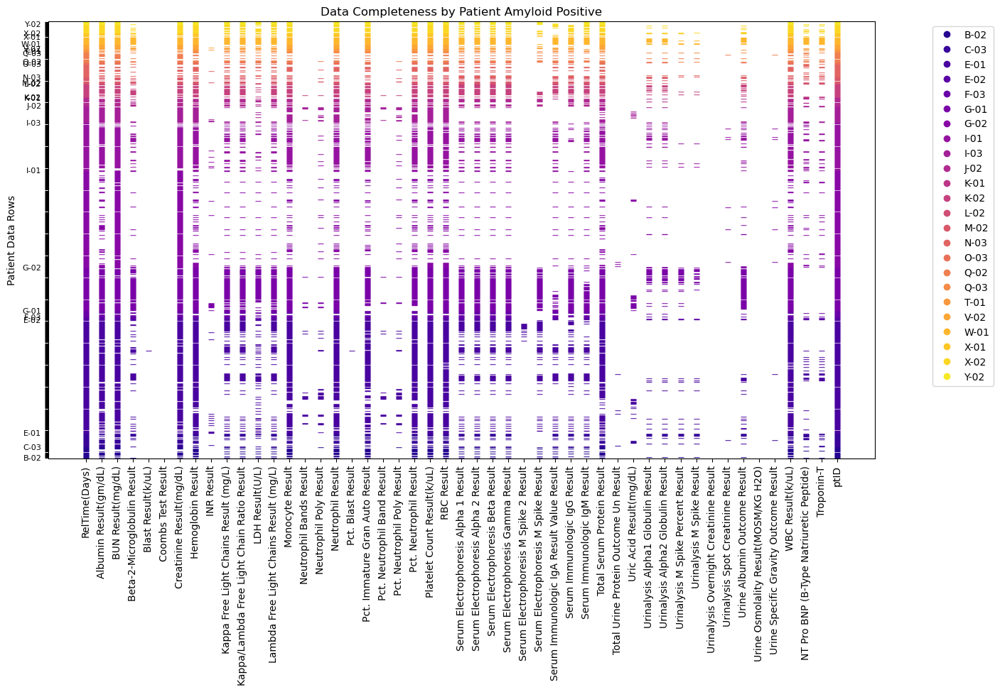

In [77]:
# Create a DataFrame to indicate the presence (1) or absence (0) of data
presence_matrix = df_ALStatus_labs.notnull().astype(int)

# Generate a color palette with a unique color for each patient
unique_patients = df_ALStatus_labs['ptID'].unique()
num_patients = len(unique_patients)
palette = sns.color_palette("plasma", num_patients)
patient_color_map = {patient: palette[i] for i, patient in enumerate(unique_patients)}

# Create a matrix plot
# fig = plt.figure(figsize= (20, 8))
# ax = plt.subplot2grid((1,2), (0,0))
fig, ax = plt.subplots(figsize=(15, 8))

# Plot each row of data, coloring by patient and highlighting null values
for idx, row in df_ALStatus_labs.iterrows():
    ptID = row['ptID']
    color = patient_color_map[ptID]
    y_values = presence_matrix.loc[idx].values
    for j, value in enumerate(y_values):
        if value == 1:
            ax.plot(j, idx, '_', color=color)
        else:
            ax.plot(j, idx, '_', color='white', markersize=10)

# Customize the plot
ax.set_xticks(range(len(presence_matrix.columns))) 
ax.set_xticklabels(presence_matrix.columns, rotation = 'vertical')  
# Create y-tick labels only for the first instance of each patient
y_ticks = []
y_ticklabels = []
for i in range(len(df_ALStatus_labs)):
    if i == 0 or df_ALStatus_labs['ptID'].iloc[i] != df_ALStatus_labs['ptID'].iloc[i - 1]:
        y_ticks.append(i)
        y_ticklabels.append(df_ALStatus_labs['ptID'].iloc[i])
    else:
        y_ticks.append(i)
        y_ticklabels.append('')

ax.set_yticks(y_ticks)
ax.set_yticklabels(y_ticklabels, size = 8)
# ax.set_xlabel('Lab Results')
ax.set_ylabel('Patient Data Rows')
ax.set_ylim([-1, len(df_ALStatus_labs)])
ax.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], linestyle='') 
                   for i in range(num_patients)], loc='upper right', bbox_to_anchor=(1.15, 1))

ax.set_title('Data Completeness by Patient Amyloid Positive')

figPath = outputFiguresPath(fileName_header="ALPos", fileName_mid="-compLabs-matrix", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)

# Add sparklines to the right of the matrix plot
#correct the above to use subplot2grid
#add the spark lines using the sum of binary across a row.  plot those using the patient color
# columnsForNewDataframe = ["ptID", x_column_name]
# columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
# df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

# #get the total number of labs binary to sort the columns

# df_ALStatus_labs_all_binarysum = createBinarySum(df_ALStatus_labs, columnNames, x_column_name)

# #plot the binary sum by patient
# bottom = np.zeros(len(columnNames))

# #figure
# ax3 = plt.subplot2grid((1,2), (0,1))

# for ptID in listPositive:
#     #get patient section of frame
#     ptDatatoPlot = patientSectionOfFrame(df_ALStatus_labs, column_toMask='ptID', ptID=ptID)
#     ptDataToPlot_binary = createBinarySum(ptDatatoPlot, columnNames, x_column_name, defaxis= 1)
#     color = patient_color_map[ptID]
#     df_ALStatus_labs_binarysums = df_ALStatus_labs_binarysums._append(ptDataToPlot_binary, ignore_index = True)
#     p= ax3.bar(columnNames, ptDataToPlot_binary, width = 0.8, 
#               label = columnNames, color = color,
#               bottom = bottom)
#     bottom = bottom + ptDataToPlot_binary

# plt.show()
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


show the box plot for the amyloid positive patients

C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3107240414.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')


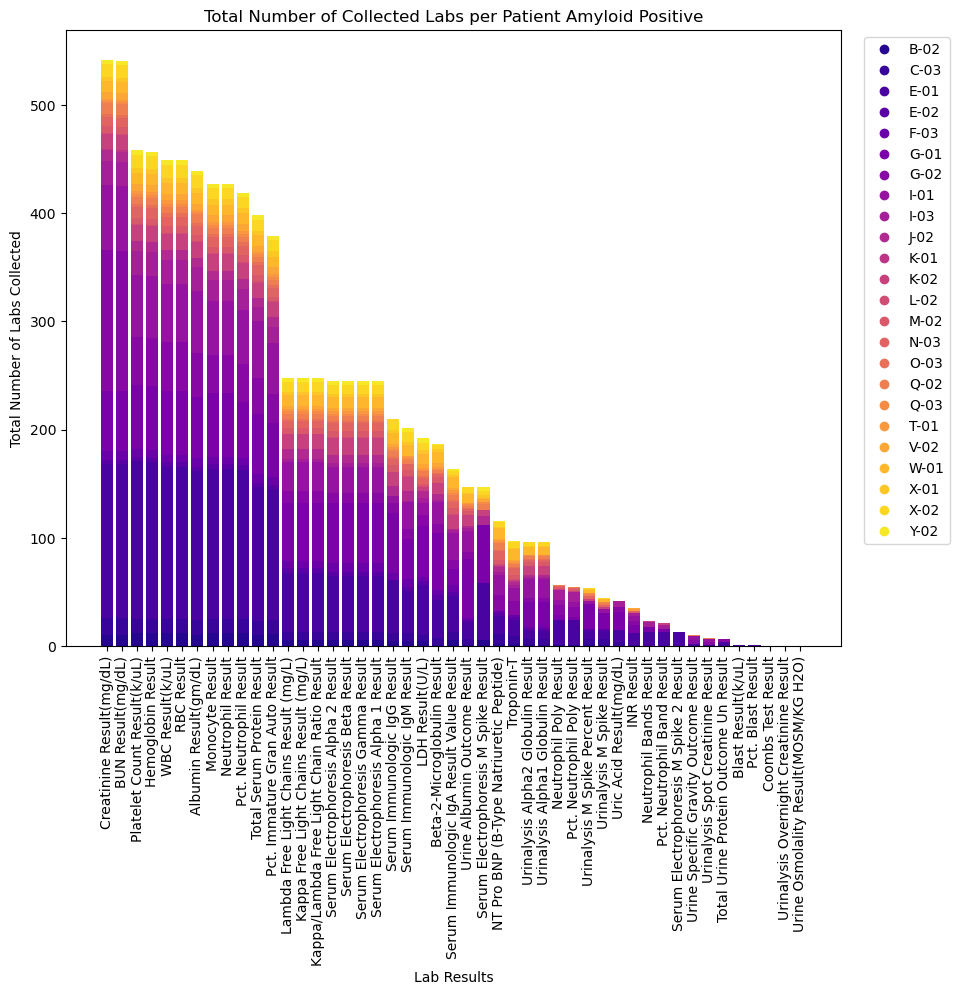

In [78]:
#create a stacked bar plot for the same data 
# Plot each row of data, coloring by patient and highlighting null values
fig, ax2=plt.subplots(figsize=(10,8))
# ax2 = plt.subplot2grid((1,2), (0,1))

columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

#get the total number of labs binary to sort the columns

df_ALStatus_labs_all_binarysum = createBinarySum(df_ALStatus_labs, columnNames, x_column_name, defaxis= 0)
#now sort the columns
sortedColumnNames = df_ALStatus_labs_all_binarysum.sort_values(axis=0, ascending=False)

bottom = np.zeros(len(sortedColumnNames))
for ptID in listPositive:
    #get patient section of frame
    ptDatatoPlot = patientSectionOfFrame(df_ALStatus_labs, column_toMask='ptID', ptID=ptID)
    ptDataToPlot_binary = createBinarySum(ptDatatoPlot, sortedColumnNames.index, x_column_name, defaxis = 0)
    color = patient_color_map[ptID]
    df_ALStatus_labs_binarysums = df_ALStatus_labs_binarysums._append(ptDataToPlot_binary, ignore_index = True)
    p= ax2.bar(sortedColumnNames.index, ptDataToPlot_binary, width = 0.8, 
              label = sortedColumnNames.index, color = color,
              bottom = bottom)
    bottom = bottom + ptDataToPlot_binary


# ax.set_xticks(ax.get_xticks)
ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')

ax2.set_xlabel('Lab Results')
ax2.set_ylabel('Total Number of Labs Collected')
ax2.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], 
                              linestyle='') for i in range(num_patients)], loc='upper right',  
                              bbox_to_anchor=(1.15, 1))

ax2.set_title("Total Number of Collected Labs per Patient Amyloid Positive")
# plt.show()

figPath = outputFiguresPath(fileName_header="ALPos", fileName_mid="-compLabs-bar", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


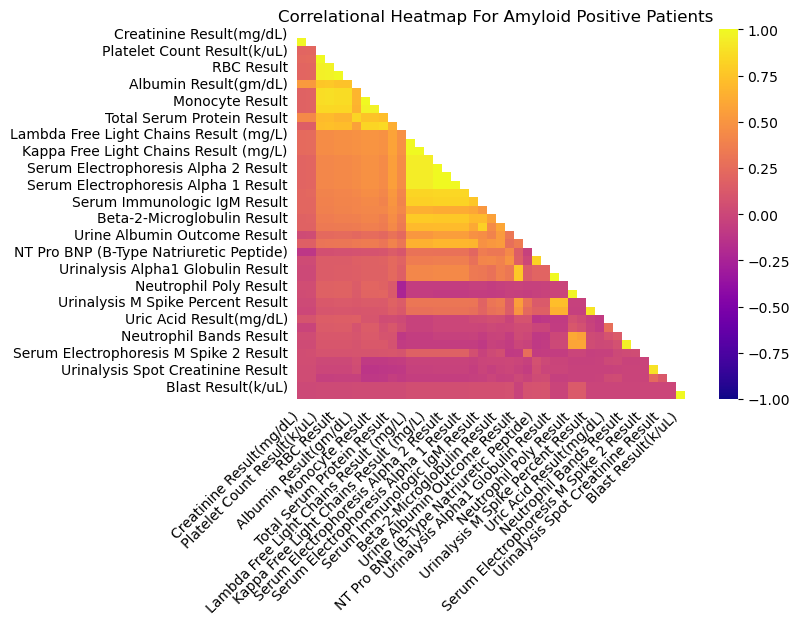

In [93]:
#correlation matrix 
fig, ax = plt.subplots()
msno.heatmap(df_ALStatus_labs, sort="descending", figsize= (15,10),
             fontsize=10, labels=False, cmap= 'plasma', ax=ax)
ax.set_title("Correlational Heatmap For Amyloid Positive Patients")
figPath = outputFiguresPath(fileName_header="ALPos", fileName_mid="-compLabs-heatmap", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')

Now for amyloid negative patients 


In [89]:
#using the filtered labs dictionary, create a new dataframe consisting of only the patients of a particular amyloid status
#create the dataframe
columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs = pd.DataFrame(columns = columnsForNewDataframe)


for pt in listNegative: 
    labsforpt = dictOfFilteredLabs[pt]

    #generate a list of length = len(x_column_name) containing only the ptID
    ptIDlabel_list = []
    i=0
    while i < len(labsforpt[x_column_name]):
        ptIDlabel_list.append(pt)
        i = i+1

    labsforpt_2 = labsforpt.assign(ptID = ptIDlabel_list)

    df_ALStatus_labs = df_ALStatus_labs._append(labsforpt_2, ignore_index = True)

#save this output some where for yourself 
outputToExcel(df_ALStatus_labs, fileName_header="ALNeg", fileName_Common="-labs", fileName_suffix=dateTag,
              parent_dir=new_dirrectory, folderName=folderName, sheetName= "ALNegLabs")


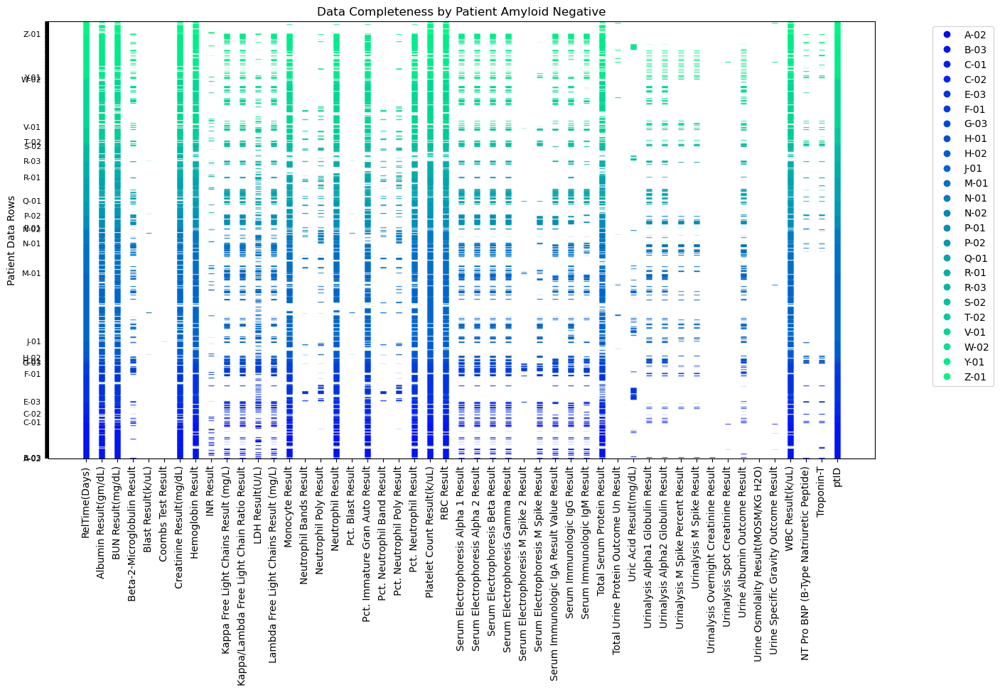

In [50]:
# Create a DataFrame to indicate the presence (1) or absence (0) of data
presence_matrix = df_ALStatus_labs.notnull().astype(int)

# Generate a color palette with a unique color for each patient
unique_patients = df_ALStatus_labs['ptID'].unique()
num_patients = len(unique_patients)
palette = sns.color_palette("winter", num_patients)
patient_color_map = {patient: palette[i] for i, patient in enumerate(unique_patients)}

# Create a matrix plot
# fig = plt.figure(figsize= (20, 8))
# ax = plt.subplot2grid((1,2), (0,0))
fig, ax = plt.subplots(figsize=(15, 8))

# Plot each row of data, coloring by patient and highlighting null values
for idx, row in df_ALStatus_labs.iterrows():
    ptID = row['ptID']
    color = patient_color_map[ptID]
    y_values = presence_matrix.loc[idx].values
    for j, value in enumerate(y_values):
        if value == 1:
            ax.plot(j, idx, '_', color=color)
        else:
            ax.plot(j, idx, '_', color='white', markersize=10)

# Customize the plot
ax.set_xticks(range(len(presence_matrix.columns))) 
ax.set_xticklabels(presence_matrix.columns, rotation = 'vertical')  
# Create y-tick labels only for the first instance of each patient
y_ticks = []
y_ticklabels = []
for i in range(len(df_ALStatus_labs)):
    if i == 0 or df_ALStatus_labs['ptID'].iloc[i] != df_ALStatus_labs['ptID'].iloc[i - 1]:
        y_ticks.append(i)
        y_ticklabels.append(df_ALStatus_labs['ptID'].iloc[i])
    else:
        y_ticks.append(i)
        y_ticklabels.append('')

ax.set_yticks(y_ticks)
ax.set_yticklabels(y_ticklabels, size = 8)
# ax.set_xlabel('Lab Results')
ax.set_ylabel('Patient Data Rows')
ax.set_ylim([-1, len(df_ALStatus_labs)])
ax.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], linestyle='') 
                   for i in range(num_patients)], loc='upper right', bbox_to_anchor=(1.15, 1))

ax.set_title('Data Completeness by Patient Amyloid Negative')

figPath = outputFiguresPath(fileName_header="ALNeg", fileName_mid="-compLabs-matrix", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)


plt.savefig(figPath, bbox_inches = 'tight')
#save this output


C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1244847747.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')


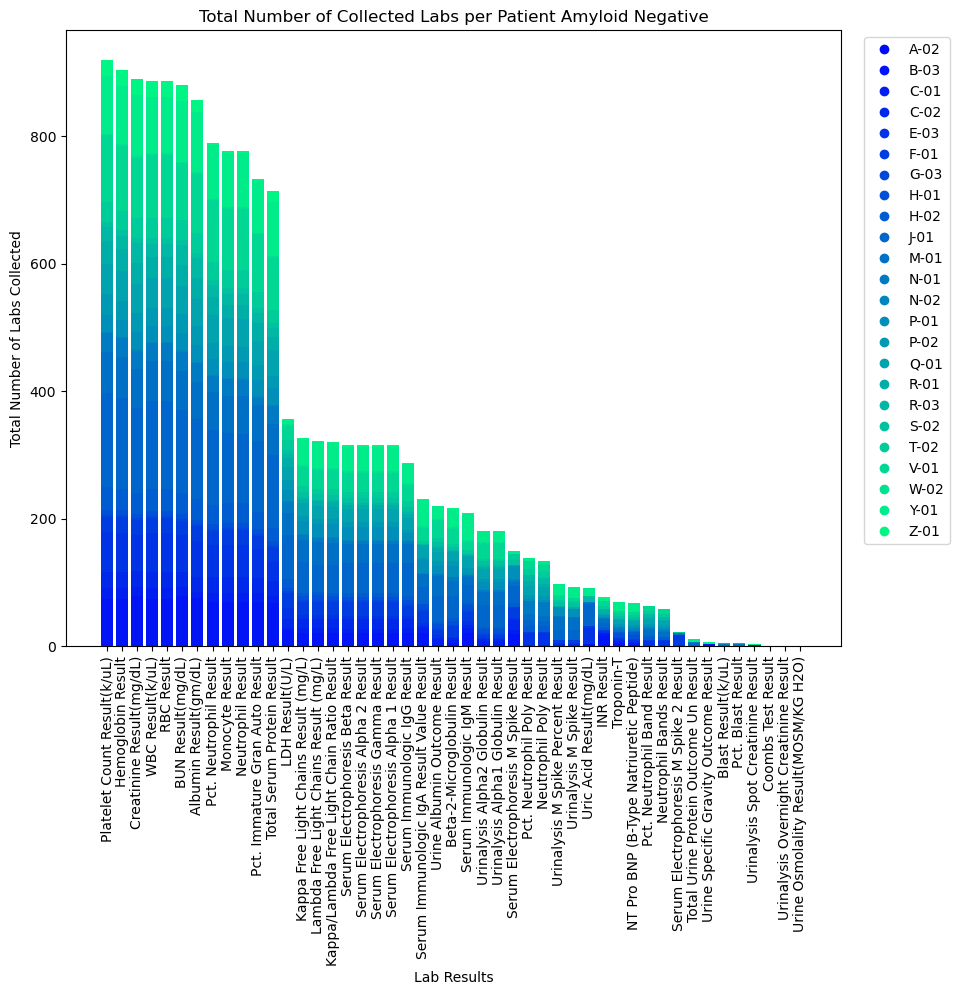

In [51]:
#create a stacked bar plot for the same data 
# Plot each row of data, coloring by patient and highlighting null values
fig, ax2=plt.subplots(figsize=(10,8))
# ax2 = plt.subplot2grid((1,2), (0,1))

columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

#get the total number of labs binary to sort the columns

df_ALStatus_labs_all_binarysum = createBinarySum(df_ALStatus_labs, columnNames, x_column_name, defaxis= 0)
#now sort the columns
sortedColumnNames = df_ALStatus_labs_all_binarysum.sort_values(axis=0, ascending=False)

bottom = np.zeros(len(sortedColumnNames))
for ptID in listNegative:
    #get patient section of frame
    ptDatatoPlot = patientSectionOfFrame(df_ALStatus_labs, column_toMask='ptID', ptID=ptID)
    ptDataToPlot_binary = createBinarySum(ptDatatoPlot, sortedColumnNames.index, x_column_name, defaxis = 0)
    color = patient_color_map[ptID]
    df_ALStatus_labs_binarysums = df_ALStatus_labs_binarysums._append(ptDataToPlot_binary, ignore_index = True)
    p= ax2.bar(sortedColumnNames.index, ptDataToPlot_binary, width = 0.8, 
              label = sortedColumnNames.index, color = color,
              bottom = bottom)
    bottom = bottom + ptDataToPlot_binary


# ax.set_xticks(ax.get_xticks)
ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')

ax2.set_xlabel('Lab Results')
ax2.set_ylabel('Total Number of Labs Collected')
ax2.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], 
                              linestyle='') for i in range(num_patients)], loc='upper right',  
                              bbox_to_anchor=(1.15, 1))

ax2.set_title("Total Number of Collected Labs per Patient Amyloid Negative")
# plt.show()

figPath = outputFiguresPath(fileName_header="ALNeg", fileName_mid="-compLabs-bar", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


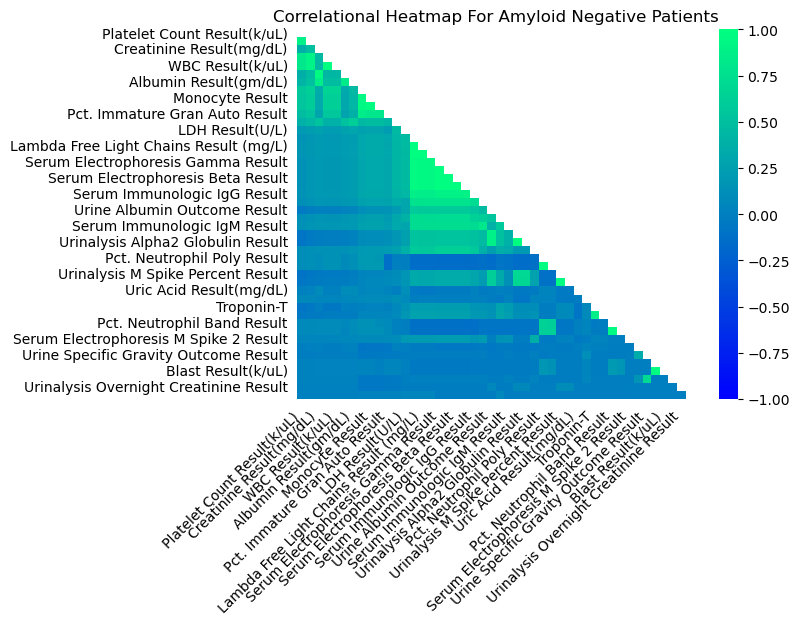

In [91]:
#correlation matrix 
fig, ax = plt.subplots()
msno.heatmap(df_ALStatus_labs, sort="descending", figsize= (15,10),
             fontsize=10, labels=False, cmap= 'winter', ax = ax)
ax.set_title("Correlational Heatmap For Amyloid Negative Patients")
figPath = outputFiguresPath(fileName_header="ALNeg", fileName_mid="-compLabs-heatmap", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')

Remaining patients 

In [83]:
#using the filtered labs dictionary, create a new dataframe consisting of only the patients of a particular amyloid status
#create the dataframe
columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs = pd.DataFrame(columns = columnsForNewDataframe)


for pt in listOther: 
    labsforpt = dictOfFilteredLabs[pt]

    #generate a list of length = len(x_column_name) containing only the ptID
    ptIDlabel_list = []
    i=0
    while i < len(labsforpt[x_column_name]):
        ptIDlabel_list.append(pt)
        i = i+1

    labsforpt_2 = labsforpt.assign(ptID = ptIDlabel_list)

    df_ALStatus_labs = df_ALStatus_labs._append(labsforpt_2, ignore_index = True)

#save this output some where for yourself 
outputToExcel(df_ALStatus_labs, fileName_header="ALOther", fileName_Common="-labs", fileName_suffix=dateTag,
              parent_dir=new_dirrectory, folderName=folderName, sheetName= "ALOtherLabs")


In [84]:
# Create a DataFrame to indicate the presence (1) or absence (0) of data
presence_matrix = df_ALStatus_labs.notnull().astype(int)

# Generate a color palette with a unique color for each patient
#get list of patients 
# ptList = list(patientDictAmyloid.keys())

unique_patients = df_ALStatus_labs["ptID"].unique()
num_patients = len(unique_patients)
# unique_patients = ptList
# num_patients = len(ptList)
palette = sns.color_palette("cool", num_patients)
patient_color_map = {patient: palette[i] for i, patient in enumerate(unique_patients)}


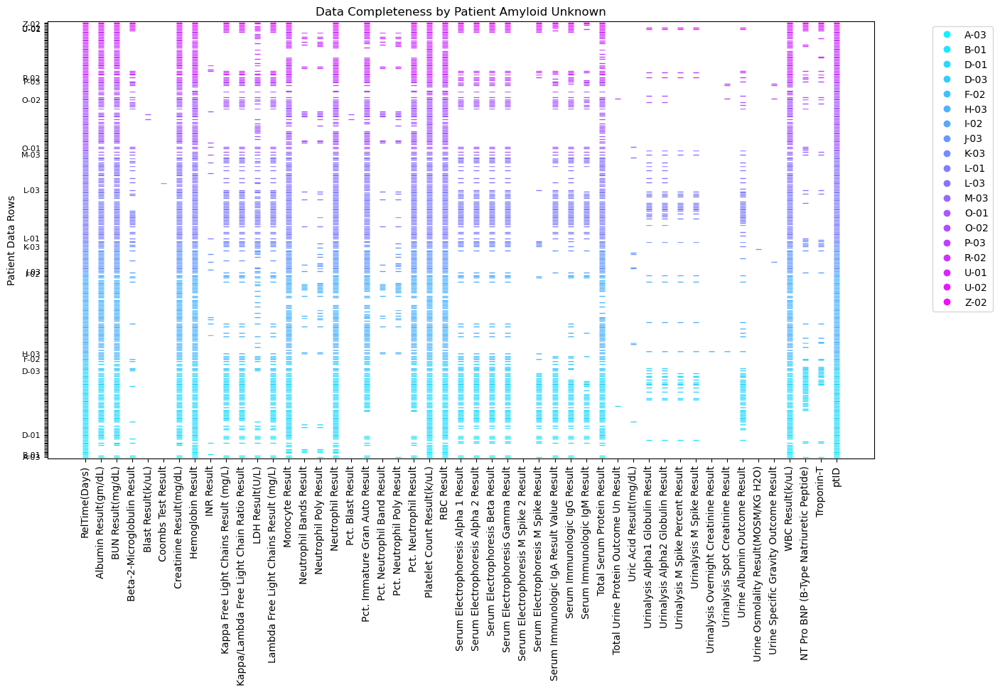

In [46]:

# Create a matrix plot
# fig = plt.figure(figsize= (20, 8))
# ax = plt.subplot2grid((1,2), (0,0))
fig, ax = plt.subplots(figsize=(15, 8))

# Plot each row of data, coloring by patient and highlighting null values
for idx, row in df_ALStatus_labs.iterrows():
    ptID = row['ptID']
    color = patient_color_map[ptID]
    y_values = presence_matrix.loc[idx].values
    for j, value in enumerate(y_values):
        if value == 1:
            ax.plot(j, idx, '_', color=color)
        else:
            ax.plot(j, idx, '_', color='white', markersize=10)

# Customize the plot
ax.set_xticks(range(len(presence_matrix.columns))) 
ax.set_xticklabels(presence_matrix.columns, rotation = 'vertical')  
# Create y-tick labels only for the first instance of each patient
y_ticks = []
y_ticklabels = []
for i in range(len(df_ALStatus_labs)):
    if i == 0 or df_ALStatus_labs['ptID'].iloc[i] != df_ALStatus_labs['ptID'].iloc[i - 1]:
        y_ticks.append(i)
        y_ticklabels.append(df_ALStatus_labs['ptID'].iloc[i])
    else:
        y_ticks.append(i)
        y_ticklabels.append('')

ax.set_yticks(y_ticks)
ax.set_yticklabels(y_ticklabels, size = 8)
# ax.set_xlabel('Lab Results')
ax.set_ylabel('Patient Data Rows')
ax.set_ylim([-1, len(df_ALStatus_labs)])
ax.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], linestyle='') 
                   for i in range(num_patients)], loc='upper right', bbox_to_anchor=(1.15, 1))

ax.set_title('Data Completeness by Patient Amyloid Unknown')

figPath = outputFiguresPath(fileName_header="ALOther", fileName_mid="-compLabs-matrix", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)


plt.savefig(figPath, bbox_inches = 'tight')
#save this output


C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3284681551.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')


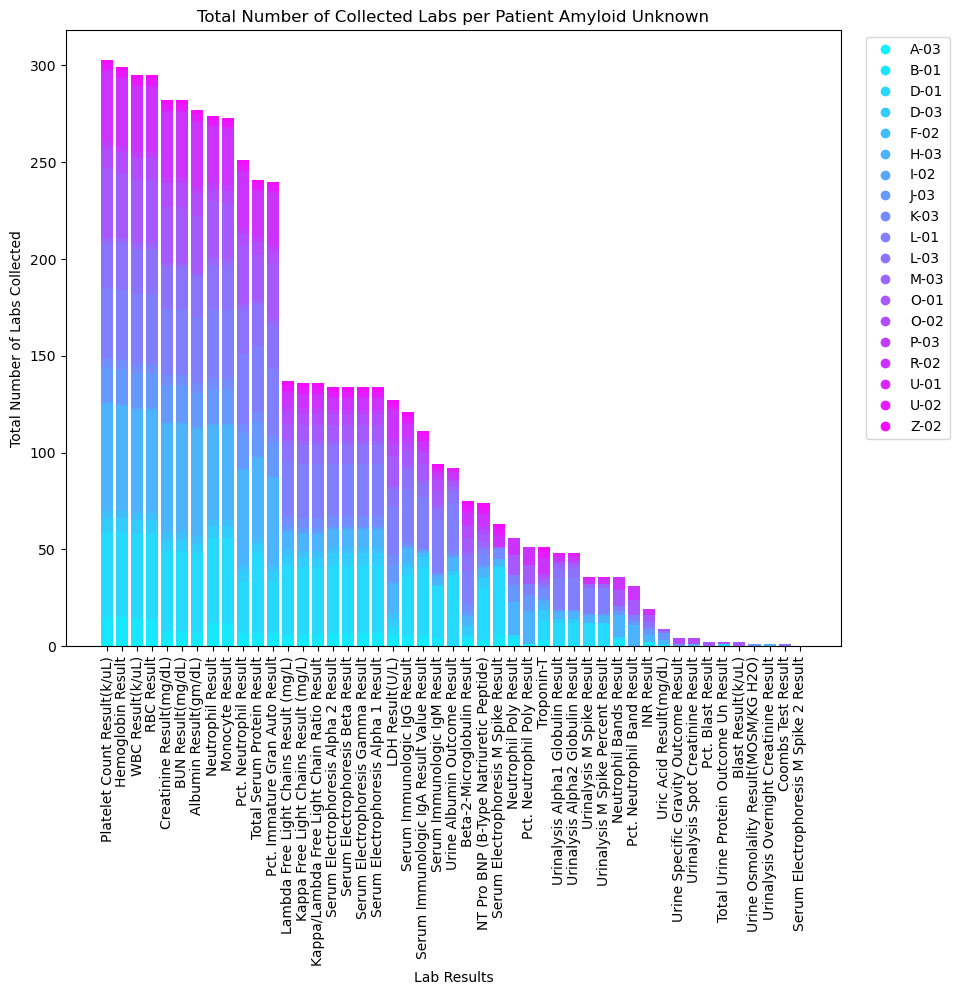

In [47]:
#create a stacked bar plot for the same data 
# Plot each row of data, coloring by patient and highlighting null values
fig, ax2=plt.subplots(figsize=(10,8))
# ax2 = plt.subplot2grid((1,2), (0,1))

columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

#get the total number of labs binary to sort the columns

df_ALStatus_labs_all_binarysum = createBinarySum(df_ALStatus_labs, columnNames, x_column_name, defaxis= 0)
#now sort the columns
sortedColumnNames = df_ALStatus_labs_all_binarysum.sort_values(axis=0, ascending=False)

bottom = np.zeros(len(sortedColumnNames))
for ptID in listOther:
    #get patient section of frame
    ptDatatoPlot = patientSectionOfFrame(df_ALStatus_labs, column_toMask='ptID', ptID=ptID)
    ptDataToPlot_binary = createBinarySum(ptDatatoPlot, sortedColumnNames.index, x_column_name, defaxis = 0)
    color = patient_color_map[ptID]
    df_ALStatus_labs_binarysums = df_ALStatus_labs_binarysums._append(ptDataToPlot_binary, ignore_index = True)
    p= ax2.bar(sortedColumnNames.index, ptDataToPlot_binary, width = 0.8, 
              label = sortedColumnNames.index, color = color,
              bottom = bottom)
    bottom = bottom + ptDataToPlot_binary


# ax.set_xticks(ax.get_xticks)
ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')

ax2.set_xlabel('Lab Results')
ax2.set_ylabel('Total Number of Labs Collected')
ax2.legend(handles=[plt.Line2D([0], [0], marker='o', color=palette[i], label=unique_patients[i], 
                              linestyle='') for i in range(num_patients)], loc='upper right',  
                              bbox_to_anchor=(1.15, 1))

ax2.set_title("Total Number of Collected Labs per Patient Amyloid Unknown")
# plt.show()

figPath = outputFiguresPath(fileName_header="ALOther", fileName_mid="-compLabs-bar", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


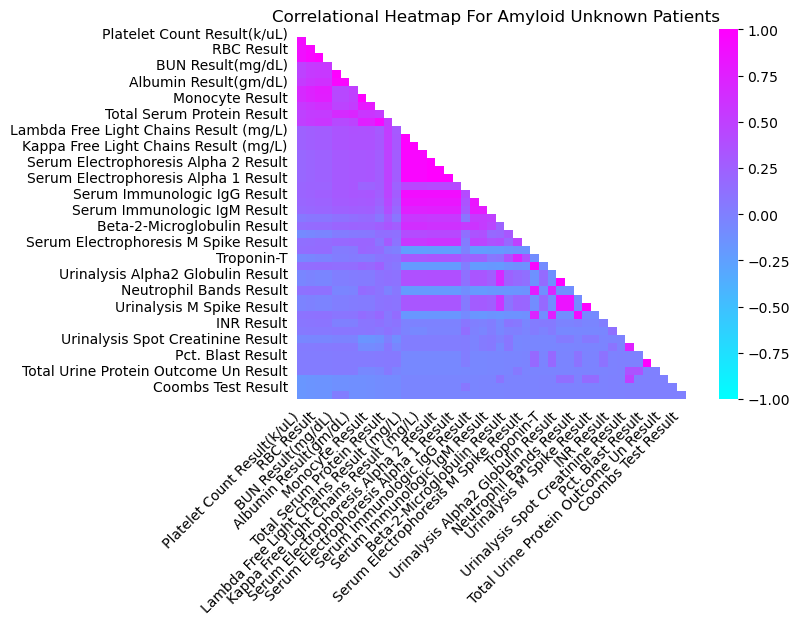

In [88]:
#correlation matrix 
fig, ax = plt.subplots()
msno.heatmap(df_ALStatus_labs, sort="descending", figsize= (15,10),
             fontsize=10, labels=False, cmap= 'cool', ax=ax)
ax.set_title("Correlational Heatmap For Amyloid Unknown Patients")
figPath = outputFiguresPath(fileName_header="ALOther", fileName_mid="-compLabs-heatmap", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')

Single patient plots for matrix of completeness, bar graph of completeness, and box plots for data values

In [216]:
#simplified list of columns
#key labs
keywords_Primary = ["BUN", "Albumin Result", "Creatinine Result",
                    "Hemoglobin", "Platelet Count", "Kappa Free Light Chains",
                    "Lambda Free Light Chains", "Free Light Chain Ratio",
                    "Total Urine Protein", "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                    "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike", "BNP",
                    "Troponin-T", "Beta-2", "LDH", "Uric Acid", "Serum Protein", "WBC", "Blast",
                    "Immature Gran", "Monocyte", "Neutrophil", "RBC", "Serum Electrophoresis",
                    "Serum Immunologic"]

In [ ]:
#dictionary for the filtered data
#this enables filtering of the patient data as its own block of code
dictOfFilteredLabs = {}
dictOfNormalRanges = {}

#other input values to set outside of loop 
x_column_name = "RelTime(Days)"

In [217]:
#creating dictionaries for all patients in the dirrectory 
for ptID_test in (patientDictLabs.keys()):
    #to collect and filter the patient labs into a dictionary
    df_Labs = patientDictLabs[ptID_test]

    orig_columns = df_Labs.columns

    #filter the patient labs
    columnNames = FilterList(orig_columns, keyWords_primary = keywords_Primary, keyWords_secondary=['Result'], 
                                omit = ['Method','Nucleated', '100'])
    # testNames = [x_column_name]
    # testNames.extend(columnNames) #addition of time label

    keywords_Primary_2 = ["Troponin-T", "BNP", ]
    columnNames2 = FilterList(orig_columns, keyWords_primary = keywords_Primary_2)
    columnNames.extend(columnNames2)
    testNames = [x_column_name]
    testNames.extend(columnNames) #addition of time label


    ptLabs_results= df_Labs[testNames] #new data frame of just results

    #troponin contains strings which mess up plotting 
    df_Labs_results_2 = ptLabs_results
    for col in columnNames:
        df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
    ptLabs_results_2 = df_Labs_results_2
    dictOfFilteredLabs[ptID_test] = ptLabs_results_2

    #filtering the patient labs dataframe for the columns containing normal values
    columnNames_ranges = FilterList(orig_columns, keyWords_primary= keywords_Primary,
                                    keyWords_secondary= ["Limit"])
    ptLabs_ranges = df_Labs[columnNames_ranges] #ranges does not include time here
    dictOfNormalRanges[ptID_test] = ptLabs_ranges
    #when plotting ranges, include time from the other dataset 


C:\Users\maega\AppData\Local\Temp\ipykernel_31372\960160234.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\960160234.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\960160234.py:34: SettingWithCopyWarning: 
A value 

In [218]:
#collecting patient information
ptID = "E-01"
ptData = dictOfFilteredLabs[ptID]



In [18]:
miniLabsTest = ["Total Serum Protein Result",
                "Albumin Result(gm/dL)",
                "Kappa Free Light Chains Result (mg/L)",
                "Kappa/Lambda Free Light Chain Ratio Result",
                "Lambda Free Light Chains Result (mg/L)",
                "Serum Electrophoresis M Spike Result",
                "Beta-2-Microglobulin Result", 
                "Total Urine Protein Outcome Un Result",
                "Creatinine Result(mg/dL)",
                "BUN Result(mg/dL)", "LDH Result(U/L)",
                "WBC Result(k/uL)", "RBC Result", 
                "Pct. Immature Gran Auto Result",
                "NT Pro BNP (B-Type Natriuretic Peptide)",
                "Troponin-T"
]

C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1187043327.py:8: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1187043327.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')


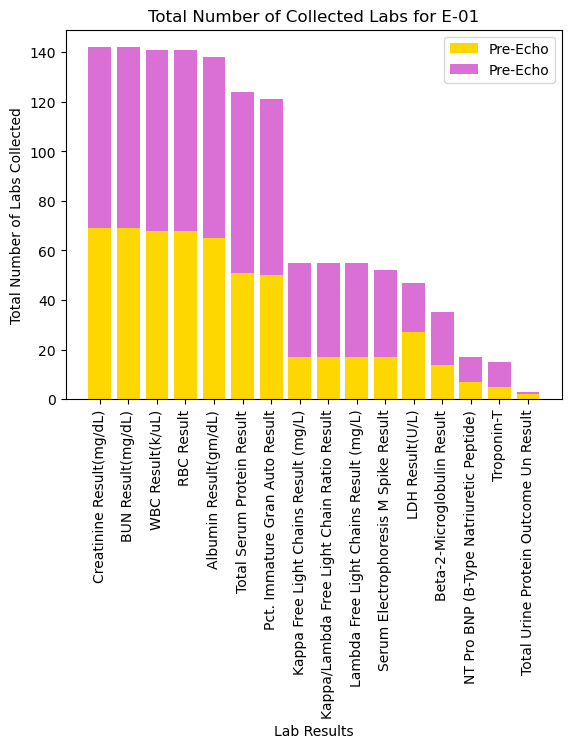

In [295]:
#bar graph of patient data completeness
#abreviate the labs 
columnNames = miniLabsTest

if ptID in list(echoDates.keys()):
    #the echoDates have been cleaned to remove non-numerical data
    patientEchoDate = echoDates[ptID]
    echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
    # axs.axvline(x = echoDate_toplot, color =echocolor)

#segmenting the data by the echo date for graphing data collection
PreEcho = ptData.loc[ptData[x_column_name] <= echoDate_toplot] #only if pt has an echo
# boxPreEcho = PreEcho[columnNames]
PostEcho = ptData.loc[ptData[x_column_name] > echoDate_toplot]
labslist = [PreEcho,PostEcho]
date_color_map = ["gold", "orchid"]
# boxPostEcho =PostEcho[columnNames]
boxAllData = ptData[columnNames]
# boxToPlot = [boxAllData, boxPreEcho, boxPostEcho]


#create a stacked bar plot for the same data 
fig, ax2=plt.subplots()
# ax2 = plt.subplot2grid((1,2), (0,1))

columnsForNewDataframe = ["ptID", x_column_name]
columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

#get the total number of labs binary to sort the columns

df_ALStatus_labs_all_binarysum = createBinarySum(ptData, columnNames, x_column_name, defaxis= 0)
#now sort the columns
sortedColumnNames = df_ALStatus_labs_all_binarysum.sort_values(axis=0, ascending=False)

bottom = np.zeros(len(sortedColumnNames))
ptDataToPlot_pre =createBinarySum(PreEcho, sortedColumnNames.index, x_column_name, defaxis=0)
p= ax2.bar(sortedColumnNames.index, ptDataToPlot_pre, width = 0.8, 
           label = sortedColumnNames.index, color = "gold", bottom = bottom)
bottom = bottom + ptDataToPlot_pre
ptDataToPlot_post = createBinarySum(PostEcho, sortedColumnNames.index, x_column_name, defaxis=0)
p= ax2.bar(sortedColumnNames.index, ptDataToPlot_post, width = 0.8, 
           label = sortedColumnNames.index, color = "orchid", bottom = bottom)

# ax.set_xticks(ax.get_xticks)
ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')

ax2.set_xlabel('Lab Results')
ax2.set_ylabel('Total Number of Labs Collected')
 #making a legend 
preecho_patch = mpatches.Patch(facecolor= "gold", label=f'Pre-Echo')
postecho_patch = mpatches.Patch(facecolor= "orchid", label=f'Pre-Echo')
# Add all patches and lines to the legend
handles = [preecho_patch, postecho_patch]
ax2.legend(handles=handles, loc='upper right', ncols=1, frameon=True)

ax2.set_title("Total Number of Collected Labs for " + ptID)

figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-bar", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


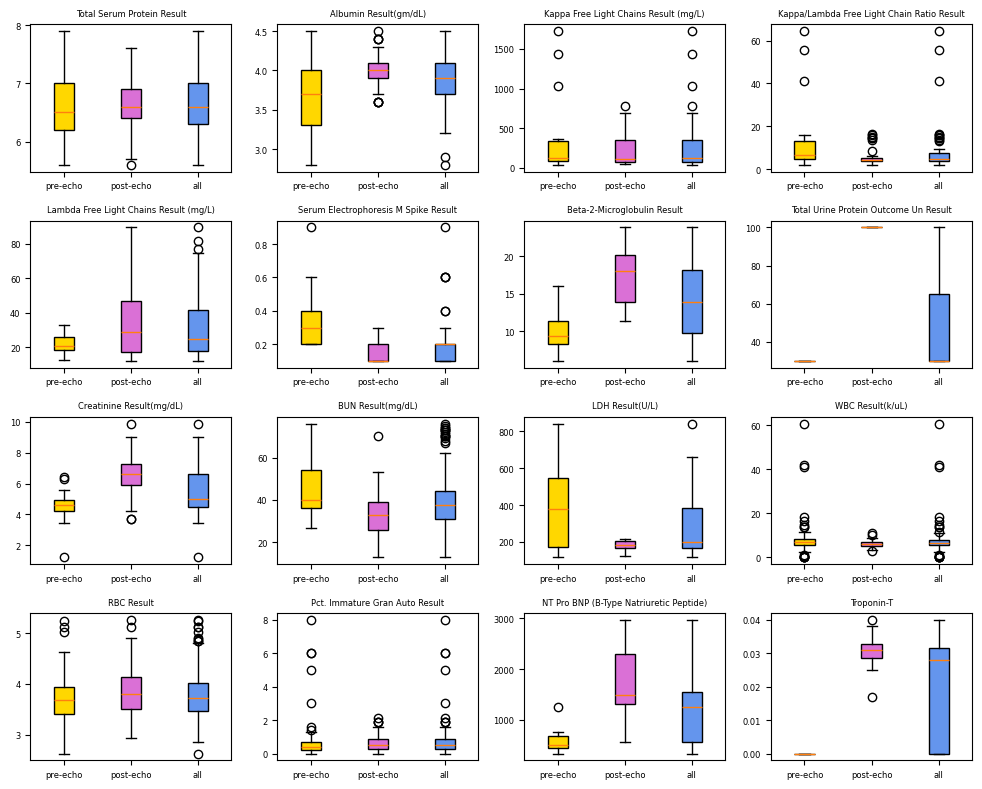

In [222]:
#box plots of patient data pre and post echo
#boxplot of the raw data pre and post echo

#creating the grid locations for the subplots
numbLabs = len(miniLabsTest)
numbOfFigureCol = 4
numbOfFigureRows = math.ceil(numbLabs/ numbOfFigureCol)

figGridLocRows = np.arange(numbOfFigureRows)
figGridLocCol = np.arange(numbOfFigureCol)
figloclist = []
for figrow in figGridLocRows:
    for figcol in figGridLocCol:
        figloclist.append((figrow, figcol))

fig = plt.figure(figsize=(10,8))

i = 0
for lab in miniLabsTest:
    preEcho_lab = PreEcho[lab].dropna() 
    postEcho_lab = PostEcho[lab].dropna()
    total_lab = ptData[lab].dropna()
    boxToPlot = [preEcho_lab, postEcho_lab, total_lab]

    #generate the axes for the figure
    ax3 = plt.subplot2grid((numbOfFigureRows, numbOfFigureCol), loc = figloclist[i])
    boxplot = ax3.boxplot(boxToPlot, patch_artist = True)

    #colors
    colorsbox = ['gold', 'orchid', 'cornflowerblue']
    # boxplot = ax3.boxplot(boxToPlot, patch_artist=True)
    for patch, color in zip(boxplot['boxes'], colorsbox):
        patch.set_facecolor(color)
    ax3.set_xticklabels(["pre-echo", "post-echo", "all"], fontsize = 6)
    plt.yticks(fontsize = 6)
    ax3.set_title(lab, fontsize = 6)
    i = i+1
plt.tight_layout()

figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-box", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')

C:\Users\maega\AppData\Local\Temp\ipykernel_31372\2314576885.py:32: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), size = 8)


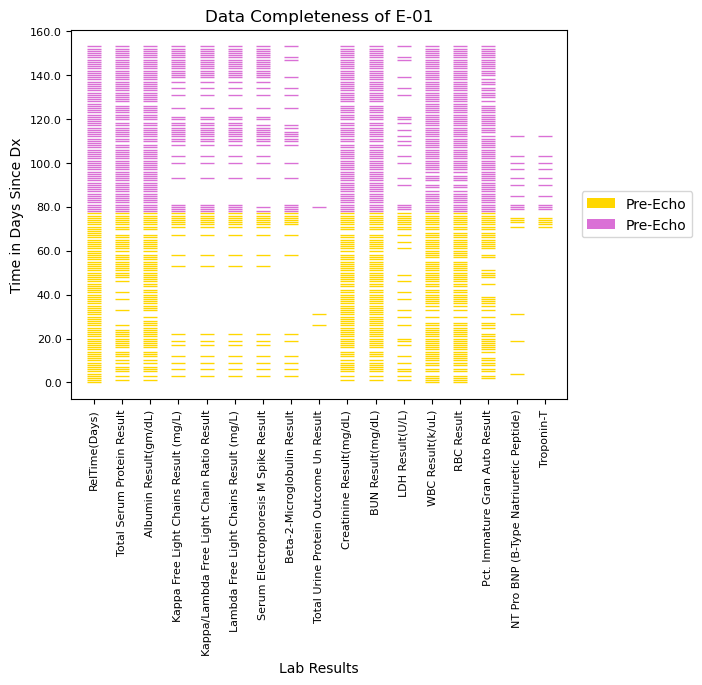

In [294]:
#matrix plot of the patient data

# Create a DataFrame to indicate the presence (1) or absence (0) of data
sampleColumns = [x_column_name]
sampleColumns.extend(miniLabsTest)
ptData2 = ptData[sampleColumns]
presence_matrix = ptData2.notnull().astype(int)

# Create a matrix plot
# fig = plt.figure(figsize= (20, 8))
# ax = plt.subplot2grid((1,2), (0,0))
fig, ax = plt.subplots()

# Plot each row of data, coloring by patient and highlighting null values
for idx, row in ptData2.iterrows():
    # ptID = row['ptID']
    if row[x_column_name] <= echoDate_toplot:
        color = "gold"
    elif row[x_column_name] > echoDate_toplot:
        color = "orchid"
    y_values = presence_matrix.loc[idx].values
    for j, value in enumerate(y_values):
        if value == 1:
            ax.plot(j, idx, '_', color=color, markersize=10)
        else:
            ax.plot(j, idx, '_', color='white', markersize=10)

# Customize the plot
xticklocations = np.array(range(len(presence_matrix.columns)))
ax.set_xticks(xticklocations) 
ax.set_xticklabels(presence_matrix.columns, rotation =90, fontsize = 8)
ax.set_yticklabels(ax.get_yticks(), size = 8)
ax.set_xlabel('Lab Results')
ax.set_ylabel('Time in Days Since Dx')

 #making a legend 
preecho_patch = mpatches.Patch(facecolor= "gold", label=f'Pre-Echo')
postecho_patch = mpatches.Patch(facecolor= "orchid", label=f'Pre-Echo')
# Add all patches and lines to the legend
handles = [preecho_patch, postecho_patch]
ax.legend(handles=handles, loc='right', ncols=1, fontsize = 10, borderaxespad=-9, frameon=True)

ax.set_title('Data Completeness of '+ ptID)
# plt.tight_layout()

figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-matrix", fileName_suff= dateTag,
                            parent_dir=new_dirrectory, folderName=folderName)
plt.savefig(figPath, bbox_inches = 'tight')
#save this output


putting it all together so we can do a loop 

In [296]:
#dirrectory and file information for where you want to save outputs

starting_directory = os.getcwd()

new_dirrectory = 'C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05'
os.chdir(new_dirrectory)

#making new path for saving output

dateTag = "_2024-06-21"
#make dirrectory for saving files 
parent_dir = new_dirrectory
folderName = "PtDataCompleteness" + dateTag
path = os.path.join(parent_dir,folderName)
if not os.path.exists(path):
    os.mkdir(path)

#create way to check to see if directory is already there

In [297]:
#dictionary for the filtered data
#this enables filtering of the patient data as its own block of code
dictOfFilteredLabs = {}
dictOfNormalRanges = {}

#other input values to set outside of loop 
x_column_name = "RelTime(Days)"

In [298]:
miniLabsTest = ["Total Serum Protein Result",
                "Albumin Result(gm/dL)",
                "Kappa Free Light Chains Result (mg/L)",
                "Kappa/Lambda Free Light Chain Ratio Result",
                "Lambda Free Light Chains Result (mg/L)",
                "Serum Electrophoresis M Spike Result",
                "Beta-2-Microglobulin Result", 
                "Total Urine Protein Outcome Un Result",
                "Creatinine Result(mg/dL)",
                "BUN Result(mg/dL)", "LDH Result(U/L)",
                "WBC Result(k/uL)", "RBC Result", 
                "Pct. Immature Gran Auto Result",
                "NT Pro BNP (B-Type Natriuretic Peptide)",
                "Troponin-T"
]

In [299]:
#creating dictionaries for all patients in the dirrectory 
for ptID_test in (patientDictLabs.keys()):
    #to collect and filter the patient labs into a dictionary
    df_Labs = patientDictLabs[ptID_test]

    orig_columns = df_Labs.columns

    #filter the patient labs
    columnNames = FilterList(orig_columns, keyWords_primary = miniLabsTest, keyWords_secondary=['Result'], 
                                omit = ['Method','Nucleated', '100'])
    # testNames = [x_column_name]
    # testNames.extend(columnNames) #addition of time label

    keywords_Primary_2 = ["Troponin-T", "BNP", ]
    columnNames2 = FilterList(orig_columns, keyWords_primary = keywords_Primary_2)
    columnNames.extend(columnNames2)
    testNames = [x_column_name]
    testNames.extend(columnNames) #addition of time label


    ptLabs_results= df_Labs[testNames] #new data frame of just results

    #troponin contains strings which mess up plotting 
    df_Labs_results_2 = ptLabs_results
    for col in columnNames:
        df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
    ptLabs_results_2 = df_Labs_results_2
    dictOfFilteredLabs[ptID_test] = ptLabs_results_2

    #filtering the patient labs dataframe for the columns containing normal values
    columnNames_ranges = FilterList(orig_columns, keyWords_primary= keywords_Primary,
                                    keyWords_secondary= ["Limit"])
    ptLabs_ranges = df_Labs[columnNames_ranges] #ranges does not include time here
    dictOfNormalRanges[ptID_test] = ptLabs_ranges
    #when plotting ranges, include time from the other dataset 


C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1876292281.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1876292281.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Labs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\1876292281.py:26: SettingWithCopyWarning: 
A val

In [300]:
EchoTimeColumn ='time from diagnosis to first echo (months)'
echoDates = {}
for pt in patientDictEcho:
    ptEchoData = patientDictEcho[pt]
    patientEchoDate = ptEchoData[EchoTimeColumn]
    if 'none' not in list(patientEchoDate):
        echoDates[pt] = patientEchoDate

C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3535788739.py:23: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3535788739.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3535788739.py:155: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), size = 8)
C:\Users\maega\AppData\Local\Temp\ipykernel_31372\3535788739.py:23: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
 

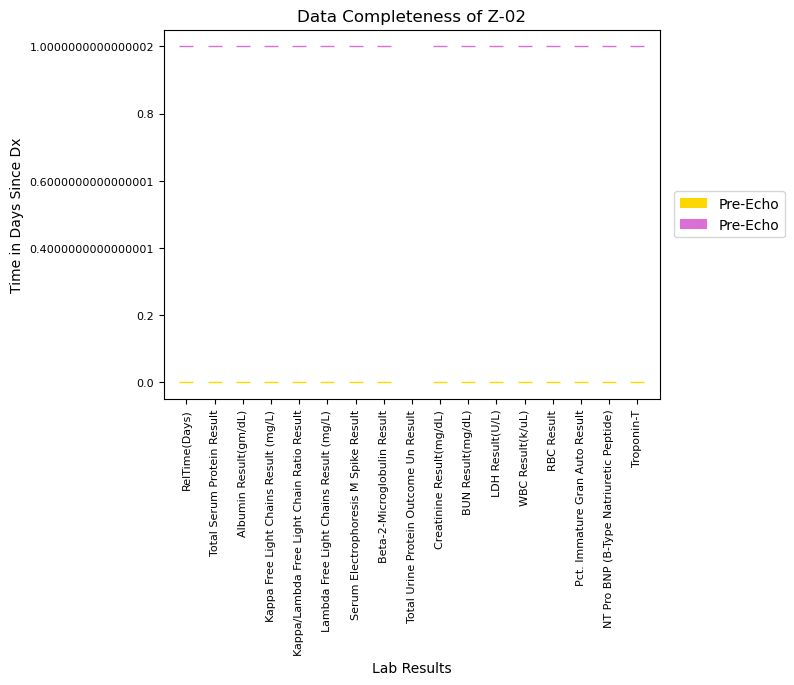

In [305]:
#to create one folder for all patient outputs use the directory process outside of the loop
subdir = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05/PtDataCompleteness_2024-06-21"

#make place to save the patient data 
ptFolder = makeFolderPathForData(parent_dir=subdir, folderName_header="byPt-",
                                folderName_common="-compPlots", folderName_suffix=dateTag)

for ptID in list(patientDictAmyloid.keys()):
        #pull the patient data 
        ptData = dictOfFilteredLabs[ptID]

        #to generate patient specific folders uncomment the below
        # subdir = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05/PtDataCompleteness_2024-06-21"

        # #make place to save the patient data 
        # ptFolder = makeFolderPathForData(parent_dir=subdir, folderName_header=ptID,
        #                                 folderName_common="-compPlots", folderName_suffix=dateTag)

        #bar graph of patient data completeness
        #abreviate the labs 
        columnNames = miniLabsTest

        if ptID in list(echoDates.keys()):
                #the echoDates have been cleaned to remove non-numerical data
                patientEchoDate = echoDates[ptID]
                echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
                # axs.axvline(x = echoDate_toplot, color =echocolor)

        #segmenting the data by the echo date for graphing data collection
        PreEcho = ptData.loc[ptData[x_column_name] <= echoDate_toplot] #only if pt has an echo
        # boxPreEcho = PreEcho[columnNames]
        PostEcho = ptData.loc[ptData[x_column_name] > echoDate_toplot]
        labslist = [PreEcho,PostEcho]
        date_color_map = ["gold", "orchid"]
        # boxPostEcho =PostEcho[columnNames]
        boxAllData = ptData[columnNames]
        # boxToPlot = [boxAllData, boxPreEcho, boxPostEcho]


        #create a stacked bar plot for the same data 
        fig, ax2=plt.subplots()
        # ax2 = plt.subplot2grid((1,2), (0,1))

        columnsForNewDataframe = ["ptID", x_column_name]
        columnsForNewDataframe = columnsForNewDataframe.append(columnNames)
        df_ALStatus_labs_binarysums = pd.DataFrame(columns = columnsForNewDataframe)

        #get the total number of labs binary to sort the columns

        df_ALStatus_labs_all_binarysum = createBinarySum(ptData, columnNames, x_column_name, defaxis= 0)
        #now sort the columns
        sortedColumnNames = df_ALStatus_labs_all_binarysum.sort_values(axis=0, ascending=False)

        bottom = np.zeros(len(sortedColumnNames))
        ptDataToPlot_pre =createBinarySum(PreEcho, sortedColumnNames.index, x_column_name, defaxis=0)
        p= ax2.bar(sortedColumnNames.index, ptDataToPlot_pre, width = 0.8, 
                label = sortedColumnNames.index, color = "gold", bottom = bottom)
        bottom = bottom + ptDataToPlot_pre
        ptDataToPlot_post = createBinarySum(PostEcho, sortedColumnNames.index, x_column_name, defaxis=0)
        p= ax2.bar(sortedColumnNames.index, ptDataToPlot_post, width = 0.8, 
                label = sortedColumnNames.index, color = "orchid", bottom = bottom)

        # ax.set_xticks(ax.get_xticks)
        ax2.set_xticklabels(sortedColumnNames.index, rotation = 'vertical')

        ax2.set_xlabel('Lab Results')
        ax2.set_ylabel('Total Number of Labs Collected')
        #making a legend 
        preecho_patch = mpatches.Patch(facecolor= "gold", label=f'Pre-Echo')
        postecho_patch = mpatches.Patch(facecolor= "orchid", label=f'Pre-Echo')
        # Add all patches and lines to the legend
        handles = [preecho_patch, postecho_patch]
        ax2.legend(handles=handles, loc='upper right', ncols=1, frameon=True)

        ax2.set_title("Total Number of Collected Labs for " + ptID)

        figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-bar", fileName_suff= dateTag,
                                parent_dir=subdir, folderName=ptFolder)
        plt.savefig(figPath, bbox_inches = 'tight')
        #save this output
        plt.close("all")


        #boxplot of the raw data pre and post echo

        #creating the grid locations for the subplots
        numbLabs = len(miniLabsTest)
        numbOfFigureCol = 4
        numbOfFigureRows = math.ceil(numbLabs/ numbOfFigureCol)

        figGridLocRows = np.arange(numbOfFigureRows)
        figGridLocCol = np.arange(numbOfFigureCol)
        figloclist = []
        for figrow in figGridLocRows:
                for figcol in figGridLocCol:
                        figloclist.append((figrow, figcol))

        fig = plt.figure(figsize=(10,8))

        i = 0
        for lab in miniLabsTest:
                preEcho_lab = PreEcho[lab].dropna() 
                postEcho_lab = PostEcho[lab].dropna()
                total_lab = ptData[lab].dropna()
                boxToPlot = [preEcho_lab, postEcho_lab, total_lab]

                #generate the axes for the figure
                ax3 = plt.subplot2grid((numbOfFigureRows, numbOfFigureCol), loc = figloclist[i])
                boxplot = ax3.boxplot(boxToPlot, patch_artist = True)

                #colors
                colorsbox = ['gold', 'orchid', 'cornflowerblue']
                # boxplot = ax3.boxplot(boxToPlot, patch_artist=True)
                for patch, color in zip(boxplot['boxes'], colorsbox):
                        patch.set_facecolor(color)
                ax3.set_xticklabels(["pre-echo", "post-echo", "all"], fontsize = 6)
                plt.yticks(fontsize = 6)
                ax3.set_title(lab, fontsize = 6)
                i = i+1
        plt.tight_layout()

        figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-box", fileName_suff= dateTag,
                                parent_dir=subdir, folderName=ptFolder)
        plt.savefig(figPath, bbox_inches = 'tight')
        plt.close("all")

        #matrix plot of the patient data

        # Create a DataFrame to indicate the presence (1) or absence (0) of data
        sampleColumns = [x_column_name]
        sampleColumns.extend(miniLabsTest)
        ptData2 = ptData[sampleColumns]
        presence_matrix = ptData2.notnull().astype(int)

        # Create a matrix plot
        # fig = plt.figure(figsize= (20, 8))
        # ax = plt.subplot2grid((1,2), (0,0))
        fig, ax = plt.subplots()

        # Plot each row of data, coloring by patient and highlighting null values
        for idx, row in ptData2.iterrows():
                # ptID = row['ptID']
                if row[x_column_name] <= echoDate_toplot:
                        color = "gold"
                elif row[x_column_name] > echoDate_toplot:
                        color = "orchid"
                y_values = presence_matrix.loc[idx].values
                for j, value in enumerate(y_values):
                        if value == 1:
                                ax.plot(j, idx, '_', color=color, markersize=10)
                        else:
                                ax.plot(j, idx, '_', color='white', markersize=10)

        # Customize the plot
        xticklocations = np.array(range(len(presence_matrix.columns)))
        ax.set_xticks(xticklocations) 
        ax.set_xticklabels(presence_matrix.columns, rotation =90, fontsize = 8)
        ax.set_yticklabels(ax.get_yticks(), size = 8)
        ax.set_xlabel('Lab Results')
        ax.set_ylabel('Time in Days Since Dx')

        #making a legend 
        preecho_patch = mpatches.Patch(facecolor= "gold", label=f'Pre-Echo')
        postecho_patch = mpatches.Patch(facecolor= "orchid", label=f'Pre-Echo')
        # Add all patches and lines to the legend
        handles = [preecho_patch, postecho_patch]
        ax.legend(handles=handles, loc='right', ncols=1, fontsize = 10, borderaxespad=-9, frameon=True)

        ax.set_title('Data Completeness of '+ ptID)
        # plt.tight_layout()

        figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-compLabs-matrix", fileName_suff= dateTag,
                                parent_dir=subdir, folderName=ptFolder)
        plt.savefig(figPath, bbox_inches = 'tight')
        #save this output

                


plotting patient lab values and normal ranges in a tiled figure

In [19]:
#normal ranges 
dictUpperLimit = {
    "Total Serum Protein Result" : 8,
    "Albumin Result(gm/dL)": 5,
    "Kappa Free Light Chains Result (mg/L)": 19.4, 
    "Kappa/Lambda Free Light Chain Ratio Result": 1.65, 
    "Lambda Free Light Chains Result (mg/L)": 26.6, 
    "Beta-2-Microglobulin Result" : 2.2, 
    "Total Urine Protein Outcome Un Result": 150, 
    "Creatinine Result(mg/dL)": 1.3,
    "BUN Result(mg/dL)": 20, 
    "LDH Result(U/L)": 280, 
    "WBC Result(k/uL)": 11,
    "RBC Result": 5.9, #using the values for males here
    "NT Pro BNP (B-Type Natriuretic Peptide)": 900, #upper limit for patients over 50
    "Troponin-T": 0.01
}

dictLowerLimit = {
    "Total Serum Protein Result": 6,
    "Albumin Result(gm/dL)": 3.5, 
    "Kappa Free Light Chains Result (mg/L)": 3.3,
    "Kappa/Lambda Free Light Chain Ratio Result" : 0.26, 
    "Lambda Free Light Chains Result (mg/L)": 5.7, 
    "Beta-2-Microglobulin Result" : 0.8, 
    "Creatinine Result(mg/dL)": 0.7,
    "BUN Result(mg/dL)" : 8, 
    "LDH Result(U/L)" : 140, 
    "WBC Result(k/uL)": 4, 
    "RBC Result": 4.3, #using the value for males here
    "NT Pro BNP (B-Type Natriuretic Peptide)": 450, #actually the upper limit for patients under 50
}

In [26]:
#plot aesthetics 
labcolor = "cornflowerblue"
echocolor = "crimson"
upperlimitcolor = "maroon"
lowerlimitcolor = "blue"

labmarker = "."


C:\Users\maega\AppData\Local\Temp\ipykernel_63532\805260640.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_63532\805260640.py:64: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_63532\805260640.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,8))


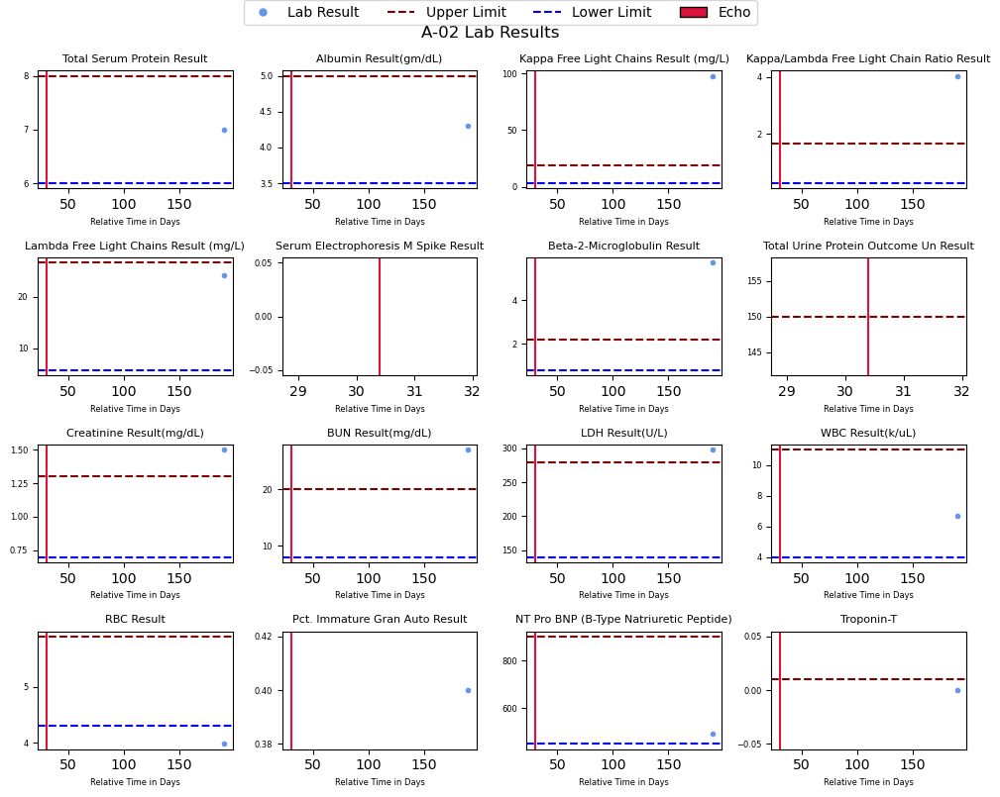

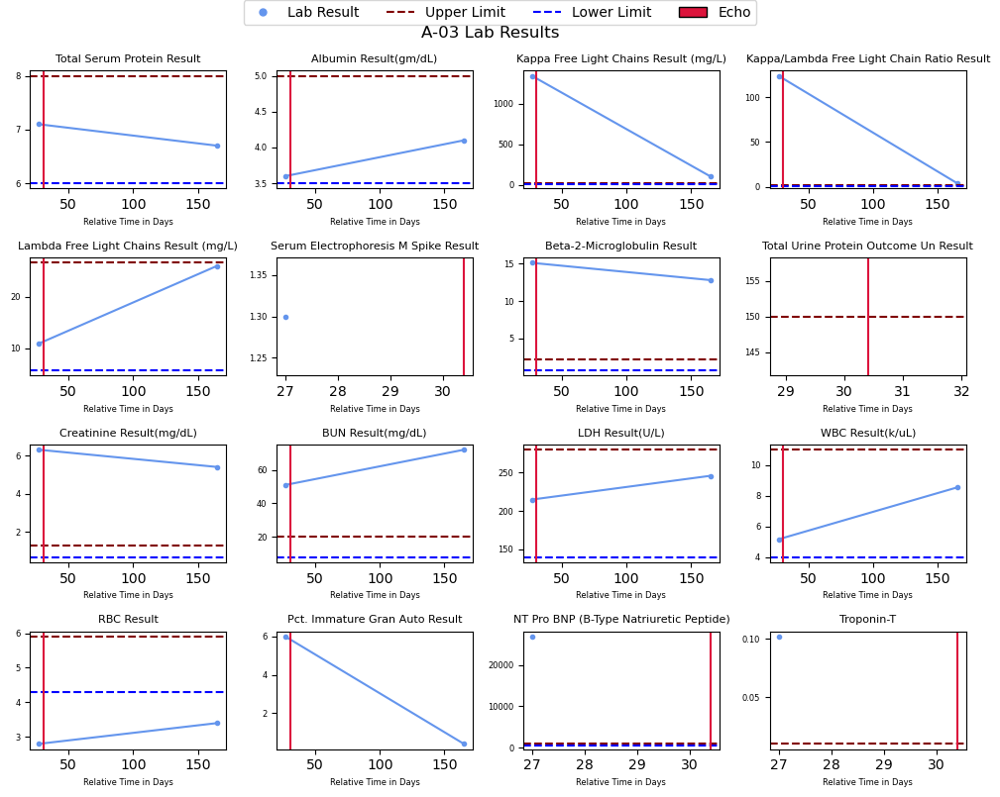

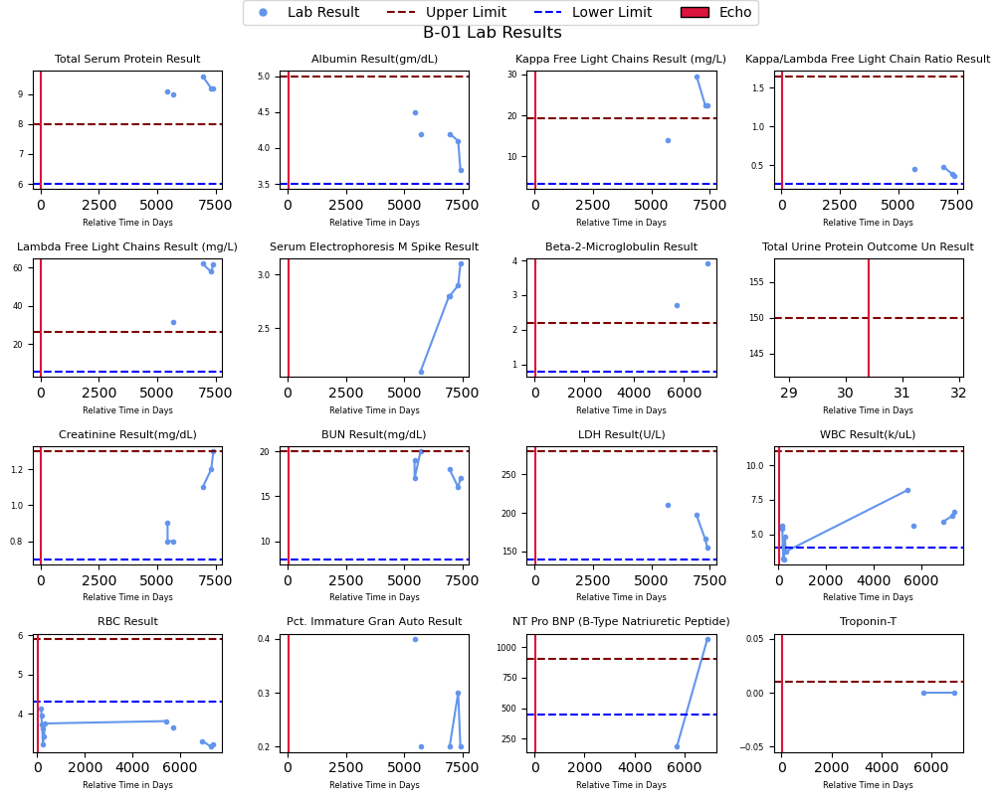

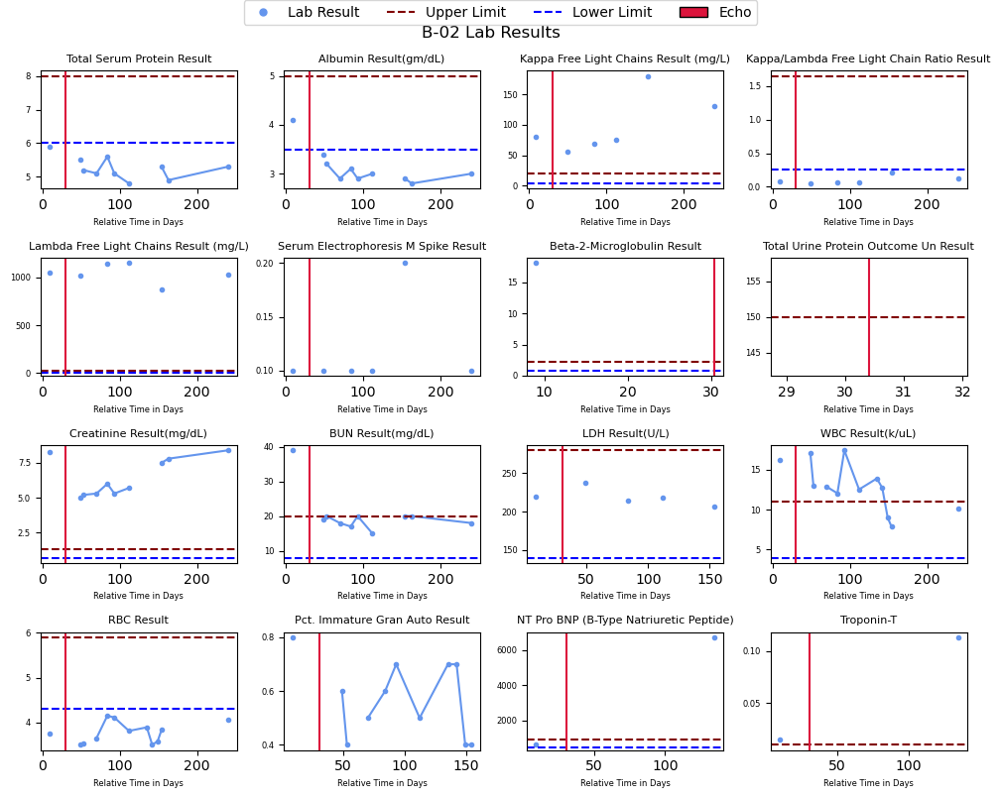

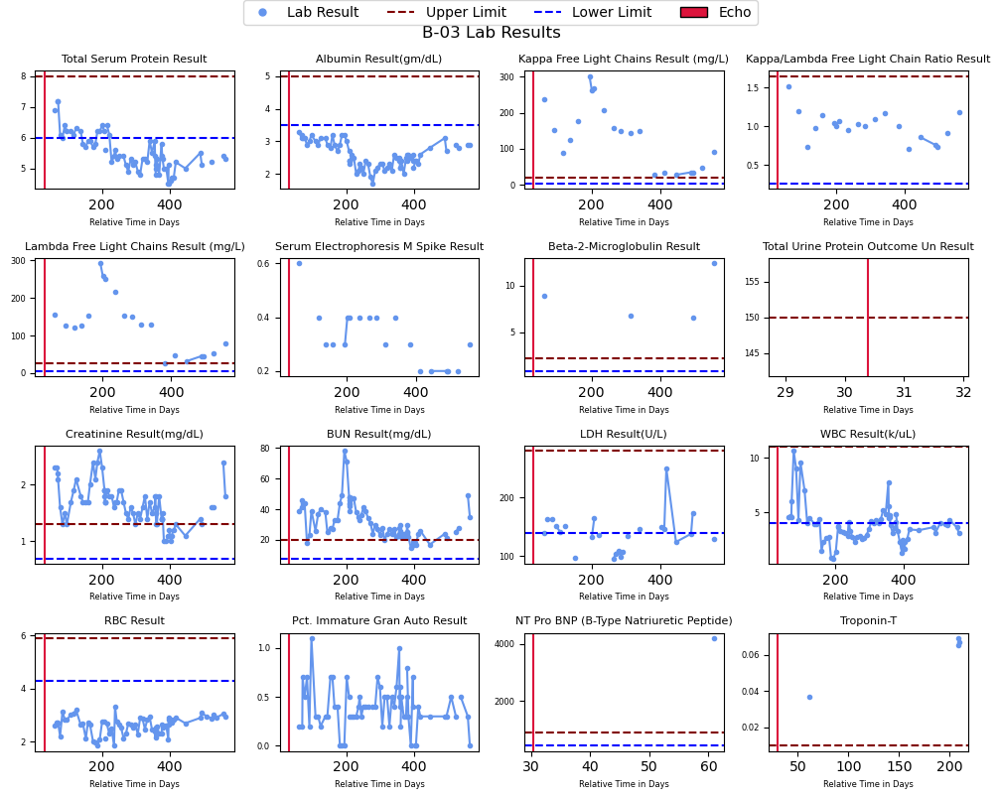

...

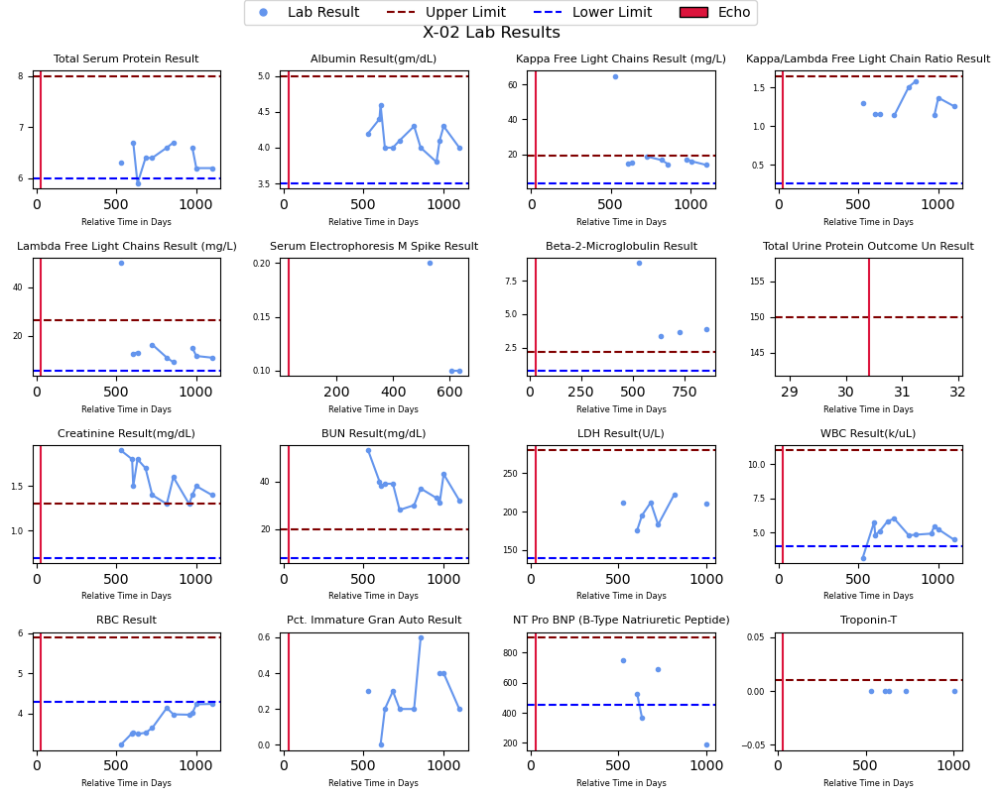

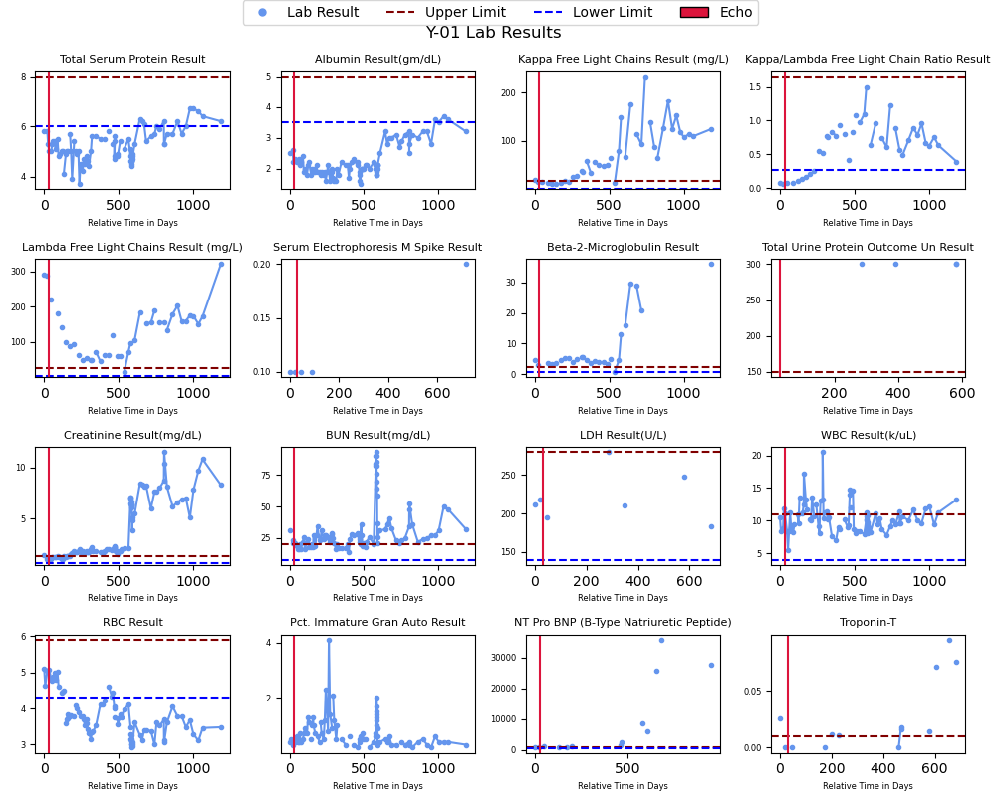

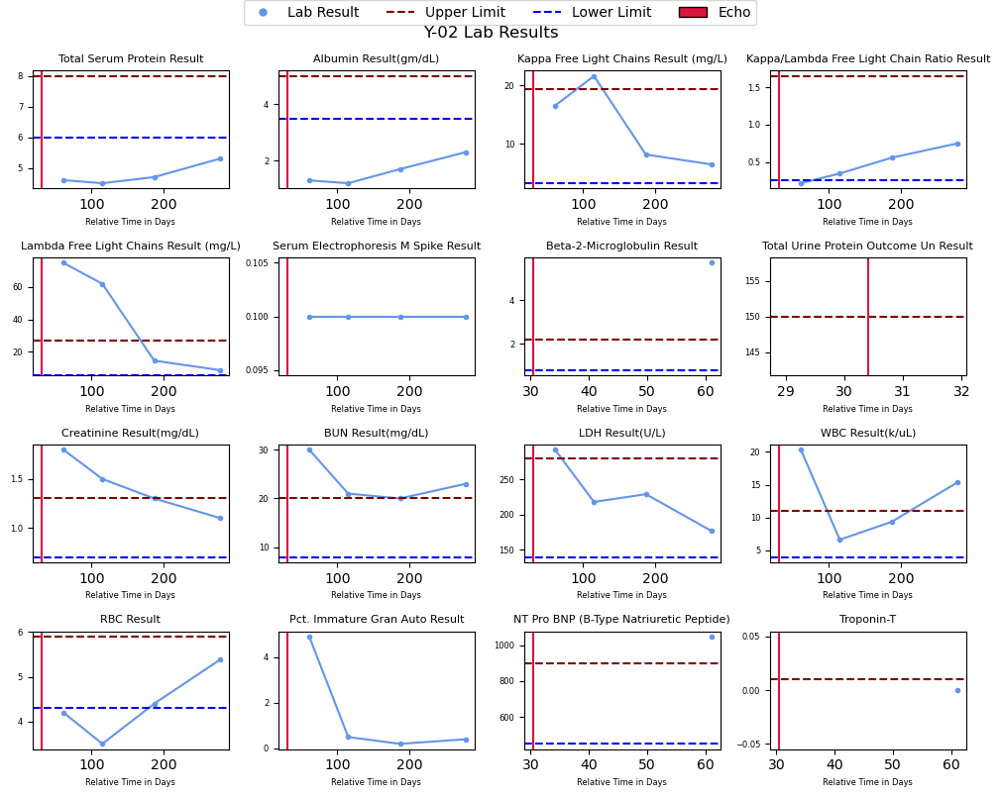

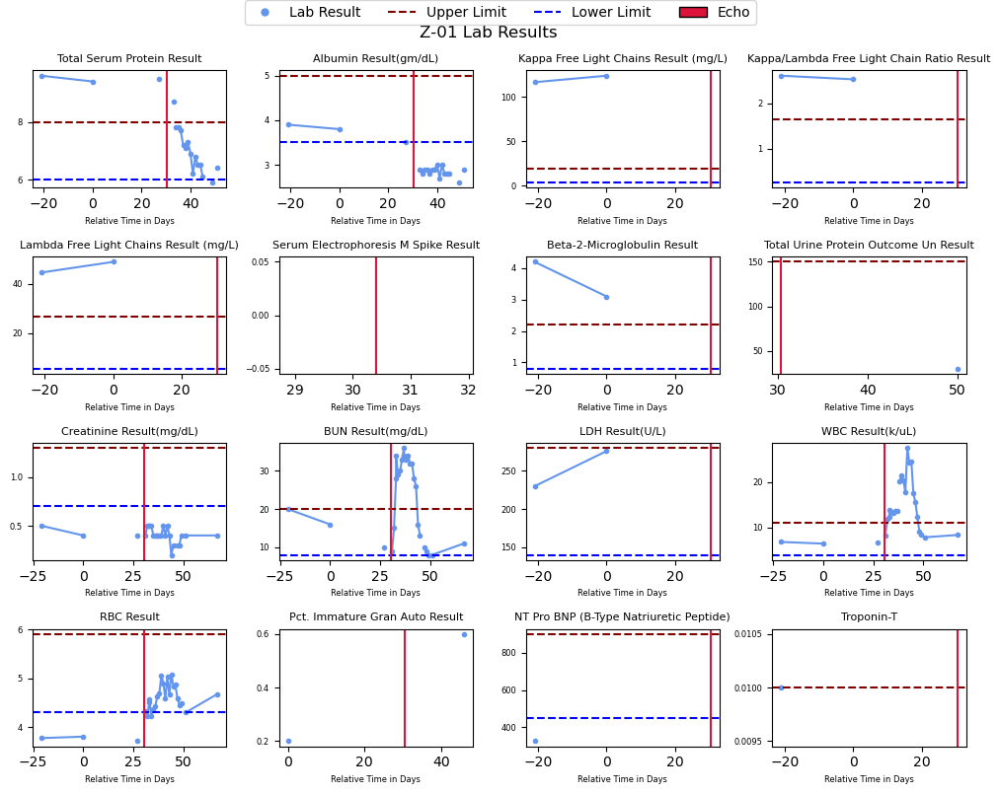

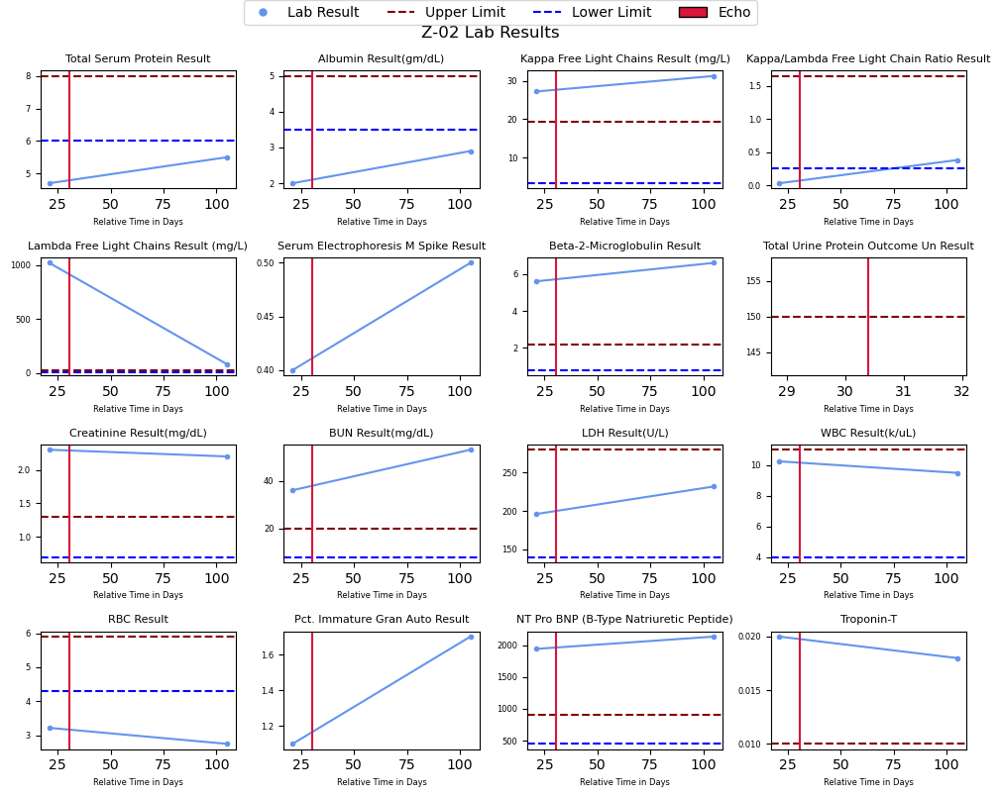

In [43]:
#to create one folder for all patient outputs use the directory process outside of the loop
subdir = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05"

#make place to save the patient data 
ptFolder = makeFolderPathForData(parent_dir=subdir, folderName_header="byPt-",
                                folderName_common="-LabPlots", folderName_suffix=dateTag)

for ptID in list(patientDictAmyloid.keys()):
        #pull the patient data 
        ptData = dictOfFilteredLabs[ptID]

        #abreviate the labs 
        columnNames = miniLabsTest

        if ptID in list(echoDates.keys()):
                #the echoDates have been cleaned to remove non-numerical data
                patientEchoDate = echoDates[ptID]
                echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
                # axs.axvline(x = echoDate_toplot, color =echocolor)

        #creating the grid locations for the subplots
        numbLabs = len(miniLabsTest)
        numbOfFigureCol = 4
        numbOfFigureRows = math.ceil(numbLabs/ numbOfFigureCol)

        figGridLocRows = np.arange(numbOfFigureRows)
        figGridLocCol = np.arange(numbOfFigureCol)
        figloclist = []
        for figrow in figGridLocRows:
                for figcol in figGridLocCol:
                        figloclist.append((figrow, figcol))

        fig = plt.figure(figsize=(10,8))

        i = 0
        for lab in miniLabsTest:

                #generate the axes for the figure
                ax3 = plt.subplot2grid((numbOfFigureRows, numbOfFigureCol), loc = figloclist[i])
                ptDataPlot = ax3.plot(ptData[x_column_name], ptData[lab], color = labcolor, marker = labmarker)

                #for plotting the normal values 
                if lab in list(dictUpperLimit.keys()):
                        #if the lab has an upper limit
                        upperlimit = dictUpperLimit[lab]
                        plt.axhline(y = upperlimit, linestyle = 'dashed', color = upperlimitcolor)
                if lab in list(dictLowerLimit.keys()):
                        lowerlimit = dictLowerLimit[lab]
                        plt.axhline(y=lowerlimit, linestyle = 'dashed', color = lowerlimitcolor)
                if ptID_test in list(echoDates.keys()):
                        #the echoDates have been cleaned to remove non-numerical data
                        patientEchoDate = echoDates[ptID_test]
                        echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
                        plt.axvline(x = echoDate_toplot, color =echocolor)

                ax3.set_xlabel("Relative Time in Days", fontsize = 6)
                plt.yticks(fontsize = 6)
                ax3.set_title(lab, fontsize = 8)
                i = i+1

        #making a legend 
        labmarker_line = plt.Line2D([0], [0], linestyle='none', marker=labmarker, color=labcolor, markersize=10, label=f'Lab Result')
        upperlimitmarker_line = plt.Line2D([0], [0], linestyle='dashed', color=upperlimitcolor, markersize=10, label=f'Upper Limit')
        lowerlimitmarker_line = plt.Line2D([0], [0], linestyle='dashed', color=lowerlimitcolor, markersize=10, label=f'Lower Limit')
        echo_patch = mpatches.Patch(facecolor= echocolor, edgecolor='black', label=f'Echo')
        # Add all patches and lines to the legend
        handles = [labmarker_line, upperlimitmarker_line, lowerlimitmarker_line, echo_patch]
        fig.legend(handles=handles, loc='upper center', borderaxespad= 0., ncols =4, frameon=True)
        fig.suptitle(ptID + " Lab Results")

        plt.tight_layout()

        figPath = outputFiguresPath(fileName_header=ptID, fileName_mid="-labsPlot", fileName_suff= dateTag,
                                parent_dir=subdir, folderName=ptFolder)
        plt.savefig(figPath, bbox_inches = 'tight')
        # #save this output

                
